In [1]:
suppressWarnings(suppressPackageStartupMessages({
    library(Seurat)
    library(Signac)
    library(EnsDb.Hsapiens.v86)
    library(dplyr)
    library(ggplot2)
    library(bedr)
    library(SeuratDisk)
    library(scales)
    library(reshape2)
    library(Hmisc)
    library(tidyr)
    library(tidyverse)
    library(crayon)
    library(readr)
    library(future)
}))

In [2]:

library(patchwork)
library(stringr)

In [3]:
set.seed(1234)
options(digits=2)
stats <- c()

In [4]:
options(future.globals.maxSize= 250 * 1024^3) # 650Gb
# plan()

# Enable parallelization
plan("multicore", workers = 10)

In [5]:
custom_theme <- theme(
  plot.title = element_text(size=16, hjust = 0.5), 
  legend.key.size = unit(0.7, "cm"), 
  legend.text = element_text(size = 14))

# Load Seurat file

In [6]:
integrated_h5_path <- '{PATH_TO_CATATAC_5_CRISPR9_ONLY_SINGLETS_W_GUIDE_CAP_H5SEURAT}'seurat_combined    <- LoadH5Seurat(integrated_h5_path, verbose = FALSE)

Validating h5Seurat file



In [7]:
seurat_combined

An object of class Seurat 
339174 features across 6656 samples within 4 assays 
Active assay: SCT (26632 features, 3000 variable features)
 3 other assays present: ATAC, RNA, guidecapture
 5 dimensional reductions calculated: lsi, umap.atac, wnn.umap, pca, umap.rna

In [8]:
# # First, we will remove negative cells from the object
# # seurat_combined <- subset(seurat_combined, idents = "Negative", invert = TRUE)
# # Calculate a tSNE embedding of the HTO data
# DefaultAssay(seurat_combined) <- "guidecapture"


In [9]:
# seurat_combined <- ScaleData(seurat_combined, features = rownames(seurat_combined),
#     verbose = FALSE)
# seurat_combined <- RunPCA(seurat_combined, features = rownames(seurat_combined), approx = FALSE)
# seurat_combined <- RunTSNE(seurat_combined, dims = 1:10, perplexity = 100)
# DimPlot(seurat_combined)

In [10]:
# # To increase the efficiency of plotting, you can subsample cells using the num.cells argument
# HTOHeatmap(seurat_combined, assay = "guidecapture")

# Keep only cells with both PS

In [11]:
# Stash cell identity classes
seurat_combined[["old.ident"]] <- Idents(object = seurat_combined)
seurat_combined <- StashIdent(object = seurat_combined, save.name = "old.ident")


With Seurat 3.X, stashing identity classes can be accomplished with the following:
seurat_combined[["old.ident"]] <- Idents(object = seurat_combined)



In [12]:
seurat_combined[[]]

,nCount_ATAC,nFeature_ATAC,nCount_RNA,nFeature_RNA,nCount_guidecapture,nFeature_guidecapture,orig.ident,percent.mt,nucleosome_signal,nucleosome_percentile,⋯,SCT.weight,ATAC.weight,wsnn_res.0.8,guidecapture_maxID,guidecapture_secondID,guidecapture_margin,guidecapture_classification,guidecapture_classification.global,hash.ID,old.ident
,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<fct>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<fct>,<chr>,<chr>,<dbl>,<chr>,<chr>,<fct>,<fct>
AAACAGCCACAACAGG-1,10251,4884,9546,3927,148,6,CATATAC_CATATAC_5_CRISPR9,8.0,0.72,0.43,⋯,0.65,0.35,5,NTCTL-1,GATA5-1,0.257,GATA5-1_NTCTL-1,Doublet,Doublet,Doublet
AAACAGCCACCACAAC-1,7425,3511,11406,4023,48,3,CATATAC_CATATAC_5_CRISPR9,11.5,0.72,0.45,⋯,0.50,0.50,9,NTCTL-2,GATA5-1,0.884,NTCTL-2,Singlet,NTCTL-2,Singlet
AAACAGCCAGGGAGGA-1,12232,5861,23017,6010,104,4,CATATAC_CATATAC_5_CRISPR9,14.3,0.86,0.89,⋯,0.63,0.37,6,NTCTL-2,MEOX1-1,0.835,NTCTL-2,Singlet,NTCTL-2,Singlet
AAACAGCCATAGGCGA-1,10948,5232,10585,3919,114,3,CATATAC_CATATAC_5_CRISPR9,12.5,0.70,0.34,⋯,0.68,0.32,9,GATA5-1,NEUROG2-1,0.946,GATA5-1,Singlet,GATA5-1,Singlet
AAACAGCCATCCGTAA-1,18701,8520,20265,6139,127,5,CATATAC_CATATAC_5_CRISPR9,13.7,0.80,0.75,⋯,0.50,0.50,1,MEOX1-2,GATA5-1,1.043,MEOX1-2,Singlet,MEOX1-2,Singlet
AAACAGCCATTGTGCA-1,12658,6029,18015,5394,134,5,CATATAC_CATATAC_5_CRISPR9,11.4,0.76,0.60,⋯,0.56,0.44,2,MEOX1-1,NEUROG2-2,0.580,Negative,Negative,Negative,Negative
AAACATGCAACACTTG-1,9391,4598,7700,3708,159,4,CATATAC_CATATAC_5_CRISPR9,5.5,0.74,0.55,⋯,0.69,0.31,6,NEUROG2-2,NEUROG2-1,1.148,NEUROG2-1_NEUROG2-2,Doublet,Doublet,Doublet
AAACATGCAGCACGAA-1,11557,5483,5976,2998,154,4,CATATAC_CATATAC_5_CRISPR9,4.6,0.74,0.53,⋯,0.49,0.51,5,NEUROG2-1,GATA5-2,0.344,GATA5-2_NEUROG2-1,Doublet,Doublet,Doublet
AAACATGCAGGACACA-1,5136,2621,31272,7096,48,3,CATATAC_CATATAC_5_CRISPR9,10.7,0.78,0.69,⋯,0.58,0.42,4,GATA5-2,MEOX1-1,0.915,GATA5-2,Singlet,GATA5-2,Singlet


In [13]:
# Set identity classes to an existing column in meta data
Idents(object = seurat_combined) <- "guidecapture_classification"

In [14]:
# # Extract cells with both PS detected
seurat.singlet <- subset(seurat_combined, idents = c("NEUROG2-1_NEUROG2-2", "GATA5-1_GATA5-2", "MEOX1-1_MEOX1-2",
                                                     "NTCTL-1_NTCTL-2"))

In [15]:
# Rename identity classes
Idents(object = seurat.singlet) <- "old.ident"

In [16]:
seurat.singlet

An object of class Seurat 
339174 features across 2394 samples within 4 assays 
Active assay: SCT (26632 features, 3000 variable features)
 3 other assays present: ATAC, RNA, guidecapture
 5 dimensional reductions calculated: lsi, umap.atac, wnn.umap, pca, umap.rna

In [17]:
DefaultAssay(seurat.singlet) <- "SCT"

# tsne embedding

In [18]:
# Calculate a tSNE embedding of the HTO data
DefaultAssay(seurat.singlet) <- "guidecapture"


Warning message:
"Requested number is larger than the number of available items (8). Setting to 8."
Warning message:
"Requested number is larger than the number of available items (8). Setting to 8."
Warning message:
"Requested number is larger than the number of available items (8). Setting to 8."
Warning message:
"Requested number is larger than the number of available items (8). Setting to 8."
Warning message:
"Requested number is larger than the number of available items (8). Setting to 8."
PC_ 1 
Positive:  GATA5-1, GATA5-2, MEOX1-2, MEOX1-1 
Negative:  NEUROG2-1, NEUROG2-2, NTCTL-1, NTCTL-2 
PC_ 2 
Positive:  GATA5-1, GATA5-2, NEUROG2-1, NEUROG2-2 
Negative:  MEOX1-2, MEOX1-1, NTCTL-2, NTCTL-1 
PC_ 3 
Positive:  MEOX1-1, MEOX1-2, NEUROG2-2, NEUROG2-1 
Negative:  NTCTL-1, NTCTL-2, GATA5-1, GATA5-2 
PC_ 4 
Positive:  NTCTL-1, NEUROG2-1, MEOX1-2, MEOX1-1 
Negative:  GATA5-2, NEUROG2-2, GATA5-1, NTCTL-2 
PC_ 5 
Positive:  GATA5-2, NTCTL-1, NEUROG2-1, MEOX1-2 
Negative:  GATA5-1, NTCT

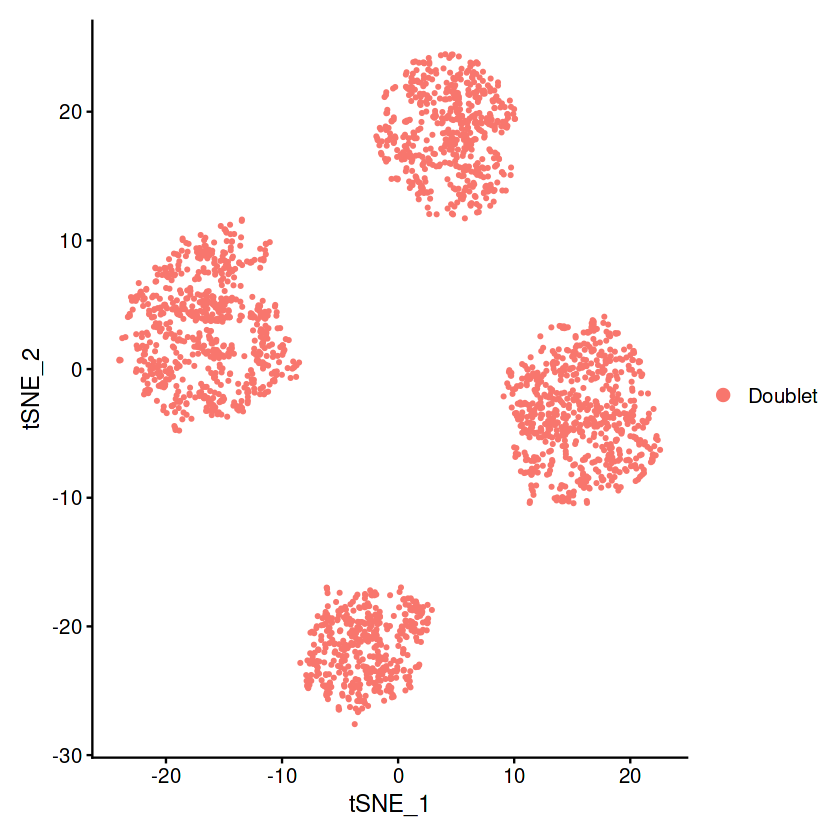

In [19]:
seurat.singlet <- ScaleData(seurat.singlet, features = rownames(seurat.singlet),
    verbose = FALSE)
seurat.singlet <- RunPCA(seurat.singlet, features = rownames(seurat.singlet), approx = FALSE)
seurat.singlet <- RunTSNE(seurat.singlet, dims = 1:13, perplexity = 100)
DimPlot(seurat.singlet)

Computing nearest neighbor graph

Computing SNN

Warning message:
"UNRELIABLE VALUE: One of the 'future.apply' iterations ('future_lapply-1') unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore"."


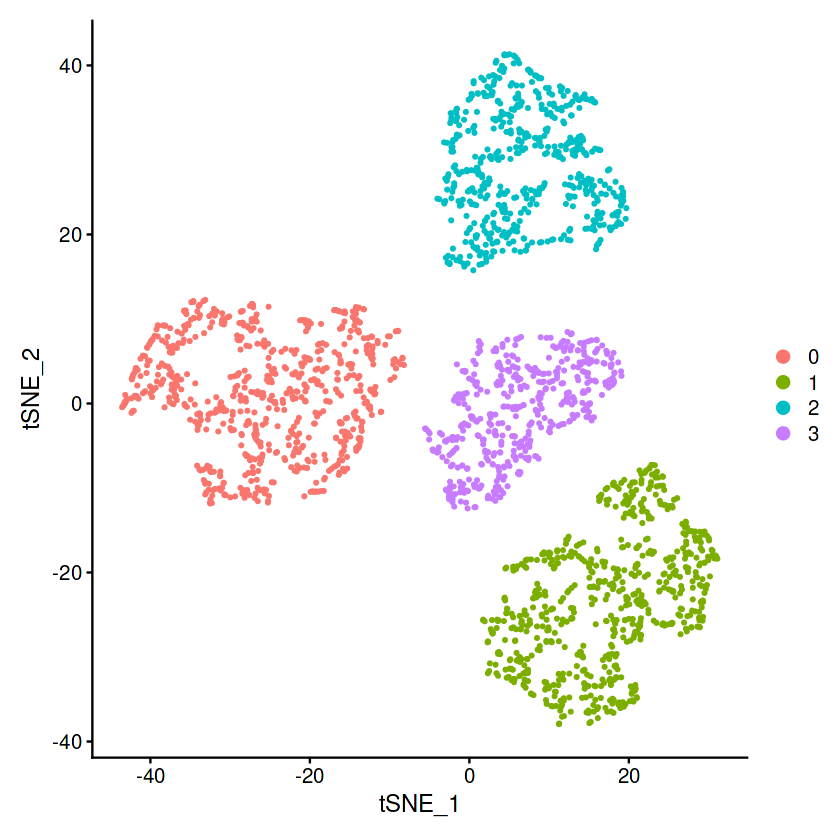

In [20]:
# We select the top 10 PCs for clustering and tSNE based on PCElbowPlot
seurat.singlet <- FindNeighbors(seurat.singlet, reduction = "pca", dims = 1:4)
seurat.singlet <- FindClusters(seurat.singlet, resolution = 0.2, verbose = FALSE)
seurat.singlet <- RunTSNE(seurat.singlet, reduction = "pca", dims = 1:4)

# Projecting singlet identities on TSNE visualization
DimPlot(seurat.singlet)

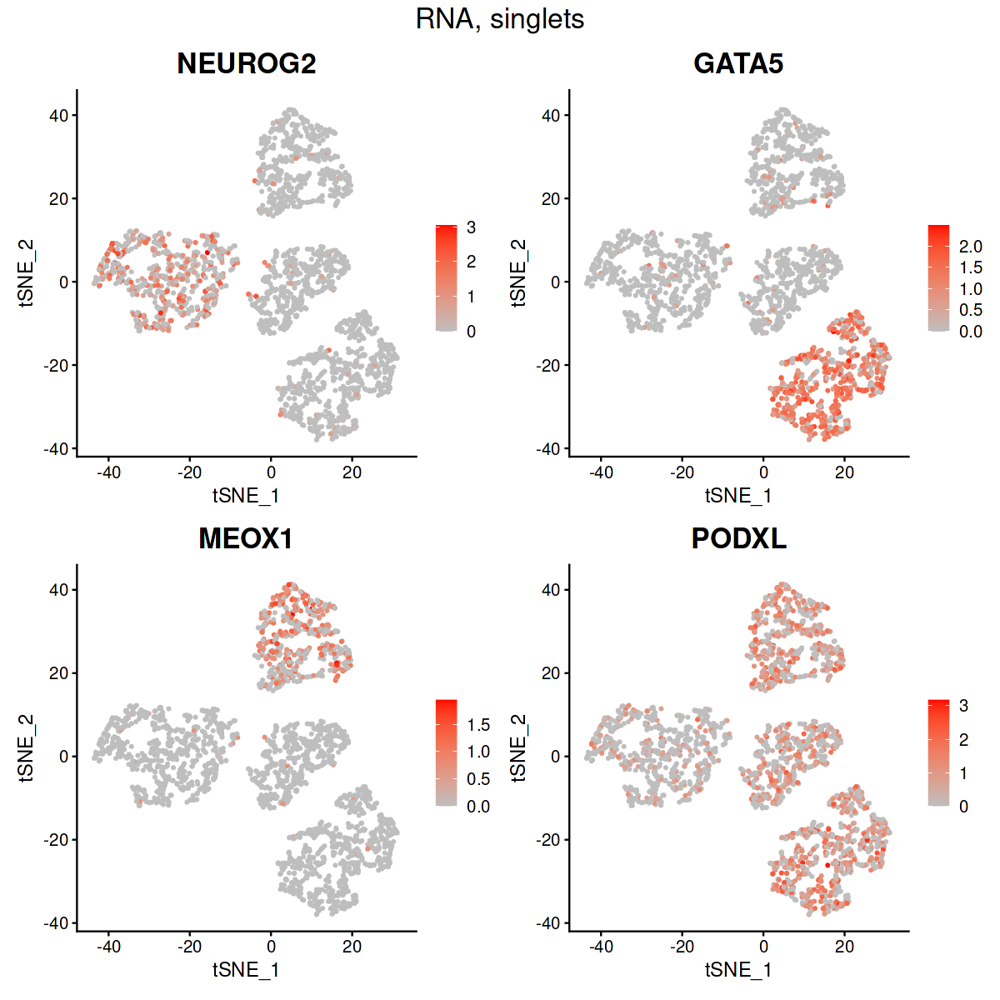

In [21]:
DefaultAssay(seurat.singlet) <- "SCT"

options(repr.plot.width = 10, repr.plot.height = 10)
FeaturePlot(
    seurat.singlet,
    features = c("NEUROG2", "GATA5", "MEOX1", "PODXL"),
    reduction = 'tsne',
    cols = c("grey", "red"),
    keep.scale = "feature"
) +
plot_annotation(title = "RNA, singlets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

In [22]:
seurat.singlet

An object of class Seurat 
339174 features across 2394 samples within 4 assays 
Active assay: SCT (26632 features, 3000 variable features)
 3 other assays present: ATAC, RNA, guidecapture
 6 dimensional reductions calculated: lsi, umap.atac, wnn.umap, pca, umap.rna, tsne

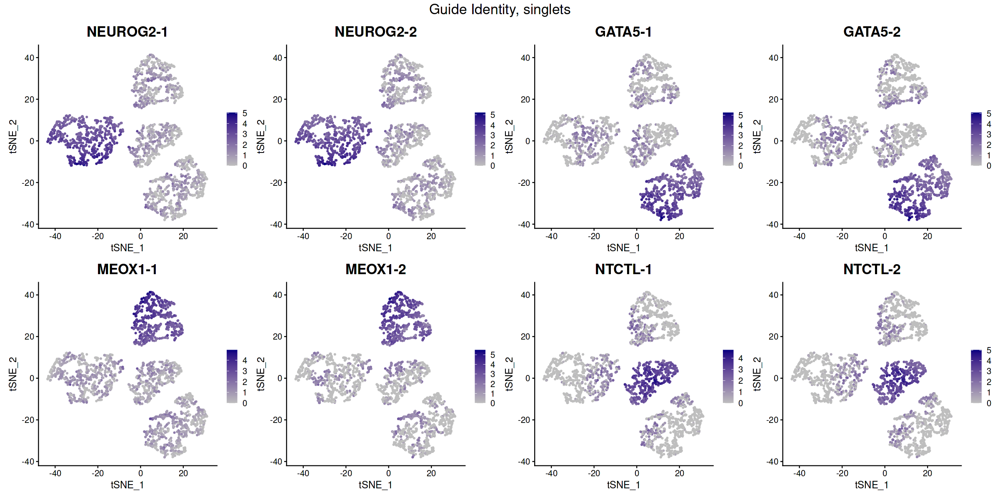

In [24]:
DefaultAssay(seurat.singlet) <- "guidecapture"

options(repr.plot.width = 20, repr.plot.height = 10)
FeaturePlot(
    seurat.singlet,
    features = c("NEUROG2-1", "NEUROG2-2", "GATA5-1", "GATA5-2", "MEOX1-1", "MEOX1-2", "NTCTL-1", "NTCTL-2"),
    reduction = 'tsne',
    cols = c("grey", "navy"),
    keep.scale = "feature",
    ncol = 4
) +
plot_annotation(title = "Guide Identity, singlets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

# UMAP embedding

In [25]:
DefaultAssay(seurat.singlet) <- "guidecapture"
seurat.singlet <- RunUMAP(seurat.singlet, reduction = "pca", dims = 1:4, reduction.name = 'umap.guide', reduction.key = 'guideUMAP_')

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
13:52:18 UMAP embedding parameters a = 0.9922 b = 1.112

13:52:18 Read 2394 rows and found 4 numeric columns

13:52:18 Using Annoy for neighbor search, n_neighbors = 30

13:52:18 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

13:52:18 Writing NN index file to temp file /tmp/RtmprJ8ZyC/file3c07b2601724bc

13:52:18 Searching Annoy index using 10 threads, search_k = 3000

13:52:18 Annoy recall = 100%

13:52:19 Commencing smooth kNN distance calibration using 10 threads
 with target n_neighb

In [26]:
seurat.singlet[[]]

,nCount_ATAC,nFeature_ATAC,nCount_RNA,nFeature_RNA,nCount_guidecapture,nFeature_guidecapture,orig.ident,percent.mt,nucleosome_signal,nucleosome_percentile,⋯,ATAC.weight,wsnn_res.0.8,guidecapture_maxID,guidecapture_secondID,guidecapture_margin,guidecapture_classification,guidecapture_classification.global,hash.ID,old.ident,guidecapture_snn_res.0.2
,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<fct>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<fct>,<chr>,<chr>,<dbl>,<chr>,<chr>,<fct>,<fct>,<fct>
AAACATGCAACACTTG-1,9391,4598,7700,3708,159,4,CATATAC_CATATAC_5_CRISPR9,5.5,0.74,0.55,⋯,0.31,6,NEUROG2-2,NEUROG2-1,1.148,NEUROG2-1_NEUROG2-2,Doublet,Doublet,Doublet,0
AAACATGCAGTAAAGC-1,5915,2910,11092,4472,379,4,CATATAC_CATATAC_5_CRISPR9,11.4,0.80,0.75,⋯,0.21,4,MEOX1-2,MEOX1-1,0.719,MEOX1-1_MEOX1-2,Doublet,Doublet,Doublet,2
AAACCGAAGACTTATG-1,13500,6268,7794,3408,243,4,CATATAC_CATATAC_5_CRISPR9,4.9,0.60,0.08,⋯,0.43,9,GATA5-1,GATA5-2,0.048,GATA5-1_GATA5-2,Doublet,Doublet,Doublet,1
AAACCGAAGCGTGCGT-1,11761,5698,7499,3537,130,3,CATATAC_CATATAC_5_CRISPR9,5.9,0.81,0.78,⋯,0.41,1,NTCTL-1,NTCTL-2,0.760,NTCTL-1_NTCTL-2,Doublet,Doublet,Doublet,3
AAACCGAAGTCTTGAA-1,10251,5011,14822,4764,283,5,CATATAC_CATATAC_5_CRISPR9,11.6,0.84,0.86,⋯,0.35,4,MEOX1-1,MEOX1-2,0.182,MEOX1-1_MEOX1-2,Doublet,Doublet,Doublet,2
AAACCGCGTTTACTTG-1,16072,7157,12474,4907,168,6,CATATAC_CATATAC_5_CRISPR9,7.4,0.84,0.85,⋯,0.46,5,NTCTL-1,NTCTL-2,0.316,NTCTL-1_NTCTL-2,Doublet,Doublet,Doublet,3
AAACGCGCACCAGCAT-1,18159,8525,14659,5215,367,4,CATATAC_CATATAC_5_CRISPR9,7.9,0.76,0.61,⋯,0.45,0,MEOX1-2,MEOX1-1,0.865,MEOX1-1_MEOX1-2,Doublet,Doublet,Doublet,2
AAACGGATCCTGGTCT-1,9620,4650,14098,4816,454,5,CATATAC_CATATAC_5_CRISPR9,14.0,0.77,0.65,⋯,0.33,4,MEOX1-2,MEOX1-1,0.412,MEOX1-1_MEOX1-2,Doublet,Doublet,Doublet,2
AAACGTACAGGTTATT-1,4520,2263,6553,3035,218,4,CATATAC_CATATAC_5_CRISPR9,4.7,0.80,0.75,⋯,0.43,5,NEUROG2-2,NEUROG2-1,0.361,NEUROG2-1_NEUROG2-2,Doublet,Doublet,Doublet,0


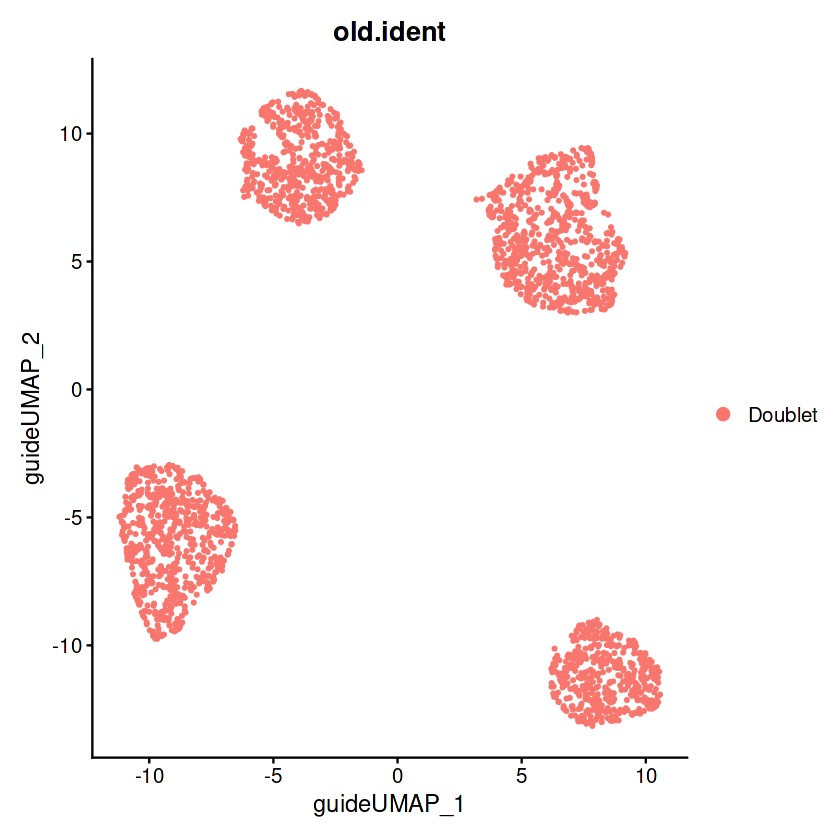

In [27]:
options(repr.plot.width = 7, repr.plot.height = 7)
DimPlot(seurat.singlet, reduction = "umap.guide", group.by = "old.ident", label = FALSE)

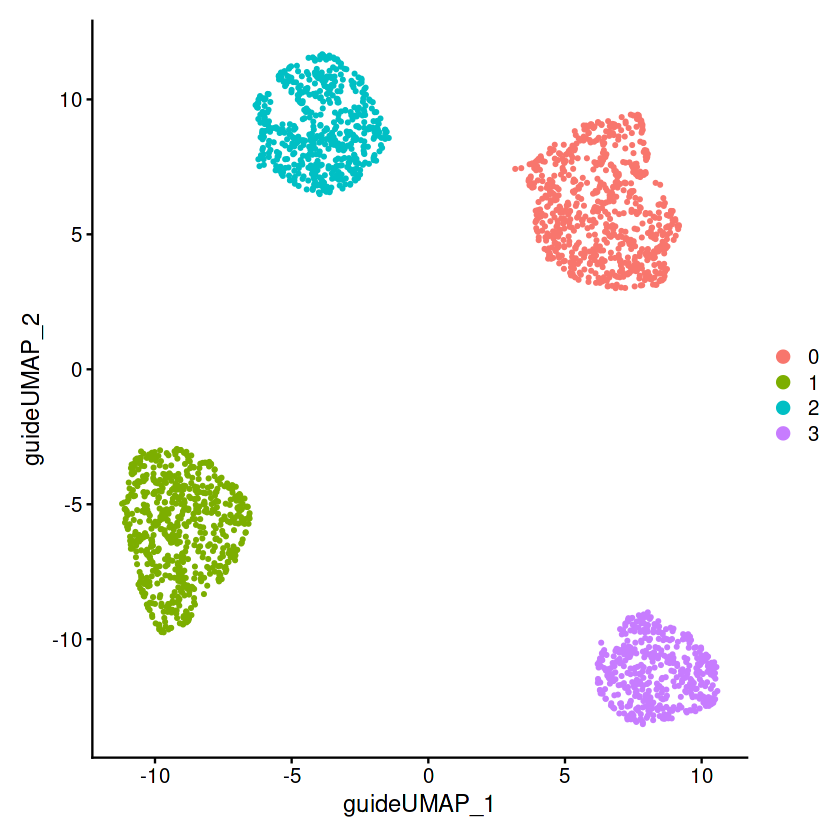

In [28]:
options(repr.plot.width = 7, repr.plot.height = 7)
DimPlot(seurat.singlet, reduction = "umap.guide", label = FALSE)

In [46]:
new_cluster_names <- c("NEUROG2-1_NEUROG2-2" = "sgNEUROG2", "GATA5-1_GATA5-2" = "sgGATA5", "MEOX1-1_MEOX1-2" = "sgMEOX1",
                           "NTCTL-1_NTCTL-2" = "sgNTCTL")

In [49]:
# Create a new metadata column "new_column" by transforming values from "old_column"
seurat.singlet$guidecapture_classification <- new_cluster_names[seurat.singlet$guidecapture_classification]

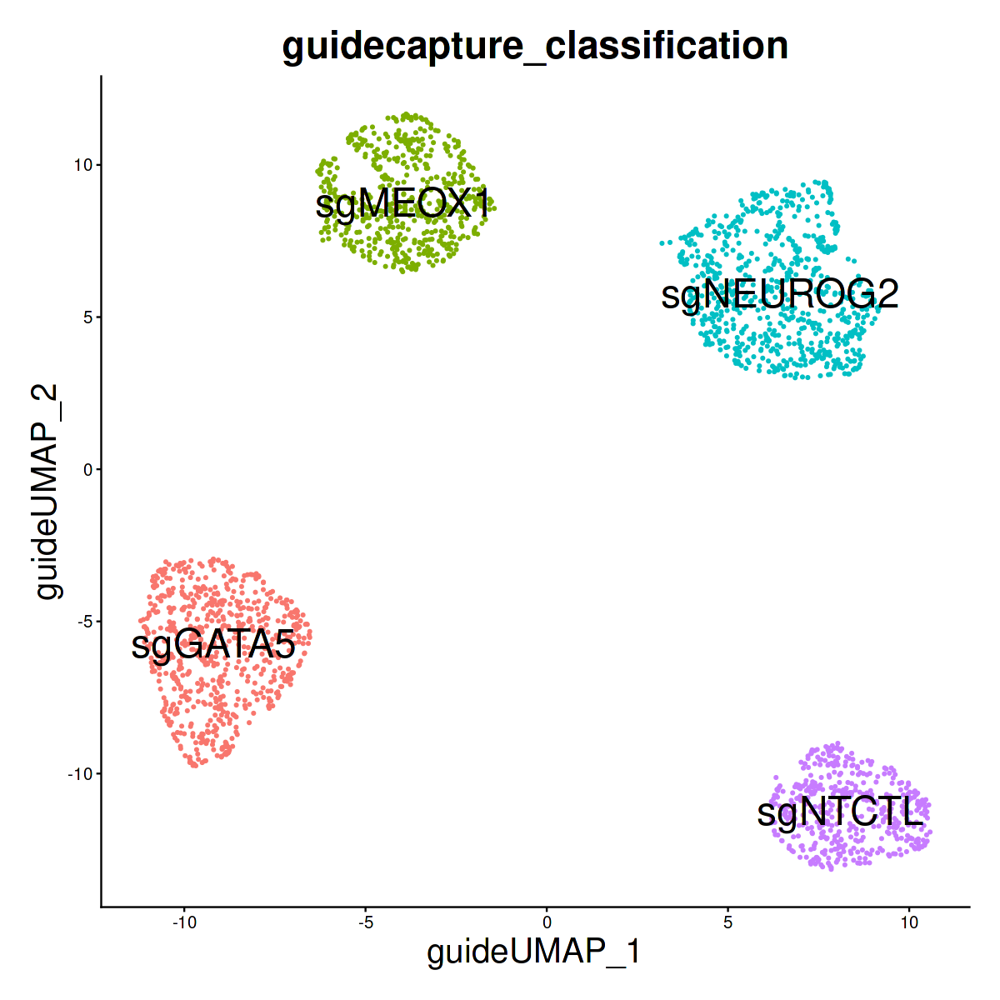

In [84]:
options(repr.plot.width = 10, repr.plot.height = 10)
DimPlot(seurat.singlet, reduction = "umap.guide", group.by = "guidecapture_classification", label = TRUE,
       label.size = 10) + theme(text = element_text(size = 24, color = "black")) + NoLegend()

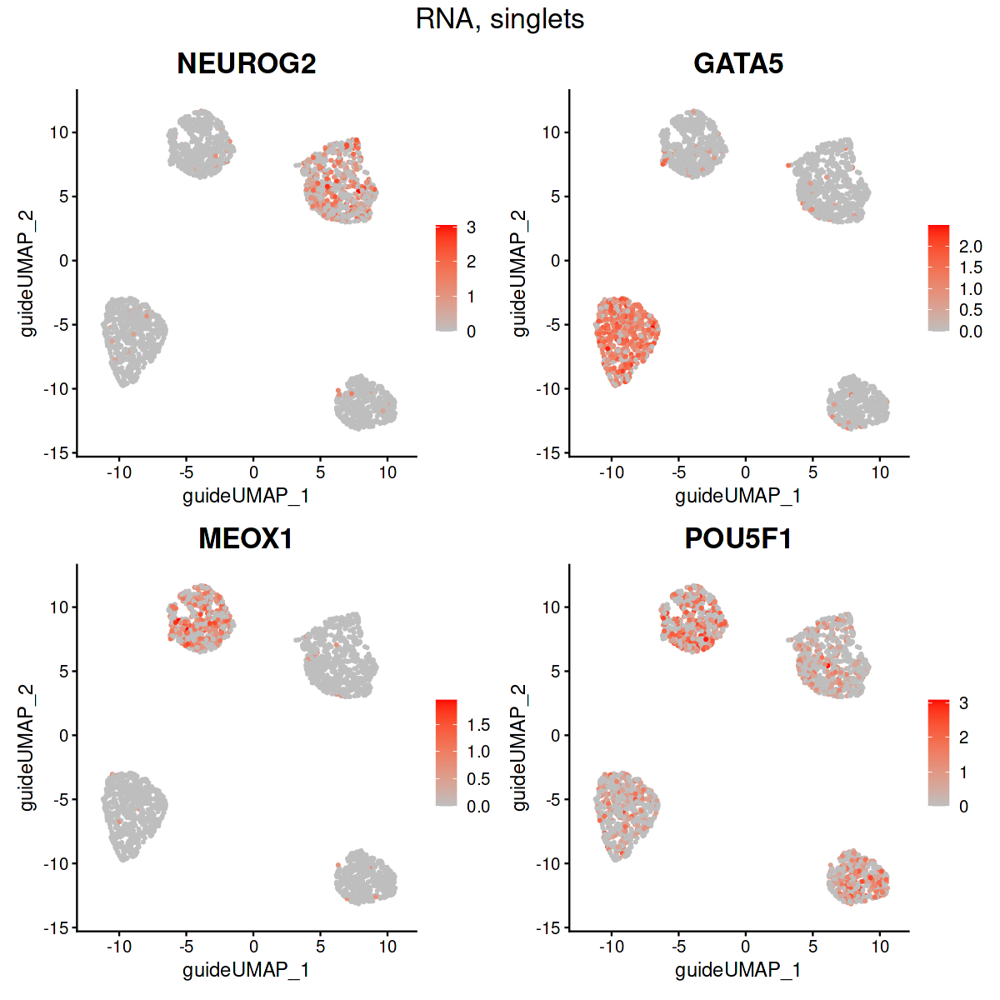

In [57]:
DefaultAssay(seurat.singlet) <- "SCT"

options(repr.plot.width = 10, repr.plot.height = 10)
FeaturePlot(
    seurat.singlet,
    features = c("NEUROG2", "GATA5", "MEOX1", "POU5F1"),
    reduction = 'umap.guide',
    cols = c("grey", "red"),
    keep.scale = "feature"
) +
plot_annotation(title = "RNA, singlets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
"The following requested variables were not found: LIN28"


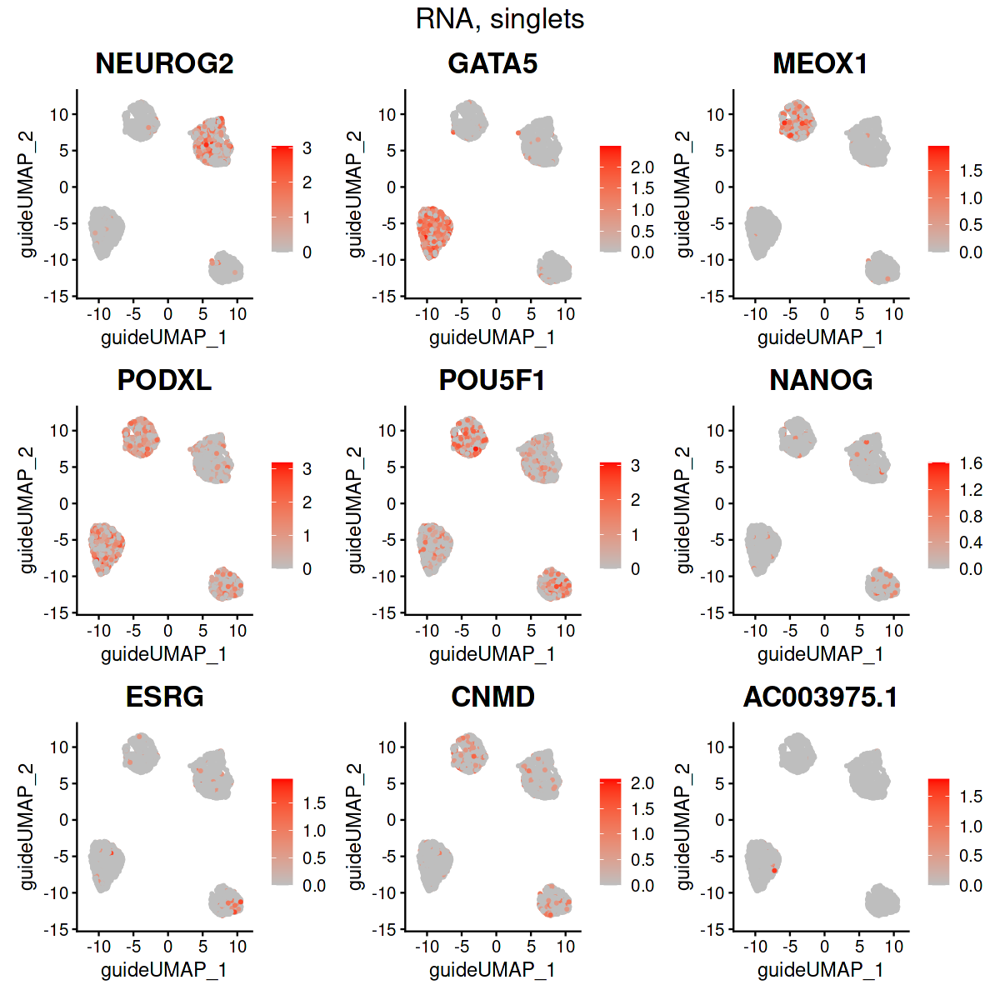

In [51]:
DefaultAssay(seurat.singlet) <- "SCT"

options(repr.plot.width = 10, repr.plot.height = 10)
FeaturePlot(
    seurat.singlet,
    features = c("NEUROG2", "GATA5", "MEOX1", "PODXL", "POU5F1", "LIN28", "NANOG", "ESRG", "CNMD", "AC003975.1"),
    reduction = 'umap.guide',
    cols = c("grey", "red"),
    keep.scale = "feature"
) +
plot_annotation(title = "RNA, singlets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

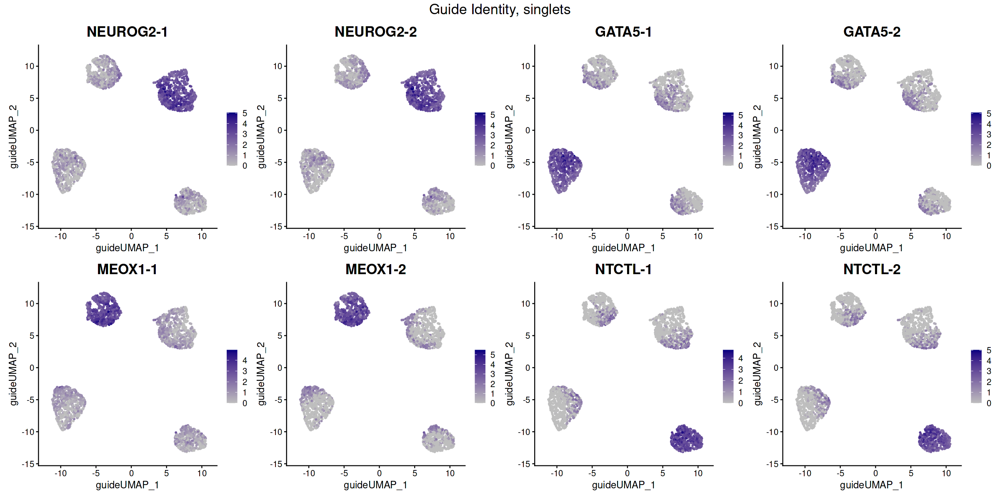

In [52]:
DefaultAssay(seurat.singlet) <- "guidecapture"

options(repr.plot.width = 20, repr.plot.height = 10)
FeaturePlot(
    seurat.singlet,
    features = c("NEUROG2-1", "NEUROG2-2", "GATA5-1", "GATA5-2", "MEOX1-1", "MEOX1-2", "NTCTL-1", "NTCTL-2"),
    reduction = 'umap.guide',
    cols = c("grey", "navy"),
    keep.scale = "feature",
    ncol = 4
) +
plot_annotation(title = "Guide Identity, singlets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

In [53]:
cluster_counts <- table(Idents(seurat.singlet))
as.data.frame(cluster_counts)

Var1,Freq
<fct>,<int>
0,712
1,677
2,549
3,456


Draw violin plots for gene expression in each cluster

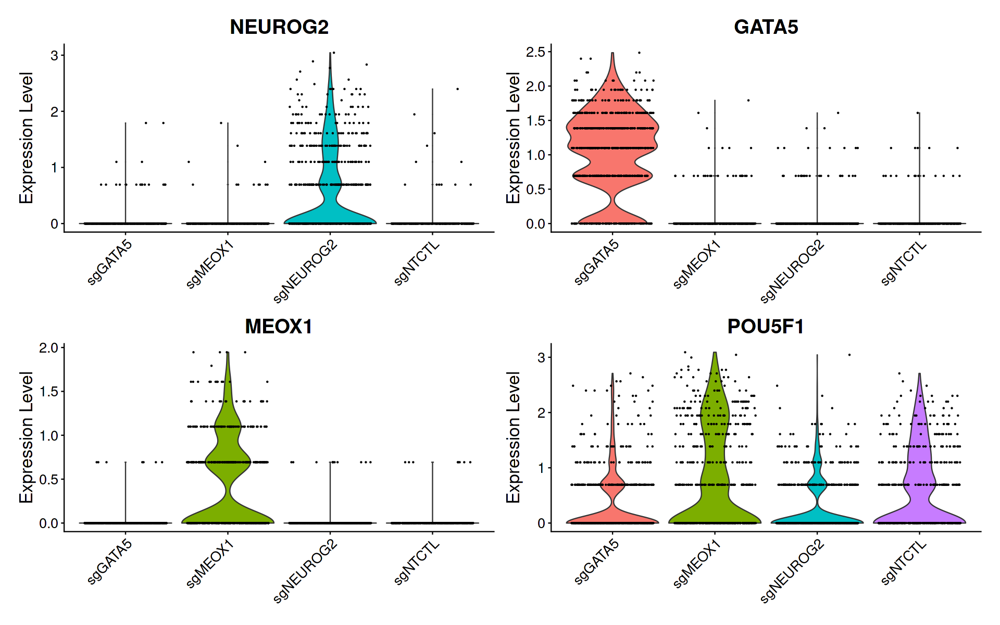

In [83]:
options(repr.plot.width = 16, repr.plot.height = 10)


# Create the VlnPlot
VlnPlot(
  object = seurat.singlet, 
  features = c("NEUROG2", "GATA5", "MEOX1", "POU5F1"),  
  pt.size = 0.2, 
  ncol = 2,
  assay = "SCT",
  group.by = "guidecapture_classification"
) & theme(text = element_text(size = 20), axis.text = element_text(size = 16), axis.title.x = element_blank())

# Heatmap for differential genes

In [48]:
markers <- FindAllMarkers(seurat.singlet, only.pos = TRUE, test.use = "wilcox", 
                          min.pct = 0.15)  #return.thresh = 1e-10
markers %>%
    group_by(cluster) %>%
    slice_max(n = 5, order_by = avg_log2FC)
markers %>%
  group_by(cluster) %>%
  top_n(n = 8, wt = avg_log2FC) -> top10

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
1.6e-252,2.85,0.86,0.565,4.3e-248,0,FN1
1.6e-303,2.31,0.63,0.119,4.2e-299,0,HAS2
1.4e-170,1.85,0.41,0.070,3.8e-166,0,PCAT14
0.0e+00,1.85,0.65,0.129,0.0e+00,0,RCN3
3.2e-165,1.77,0.44,0.093,8.5e-161,0,LHX1
1.0e-70,1.84,0.76,0.560,2.7e-66,1,TAGLN
3.4e-168,1.74,0.28,0.015,9.2e-164,1,AL392086.3
1.0e-59,1.33,0.51,0.286,2.7e-55,1,C1orf61
0.0e+00,1.23,0.57,0.058,0.0e+00,1,ADAMTSL1


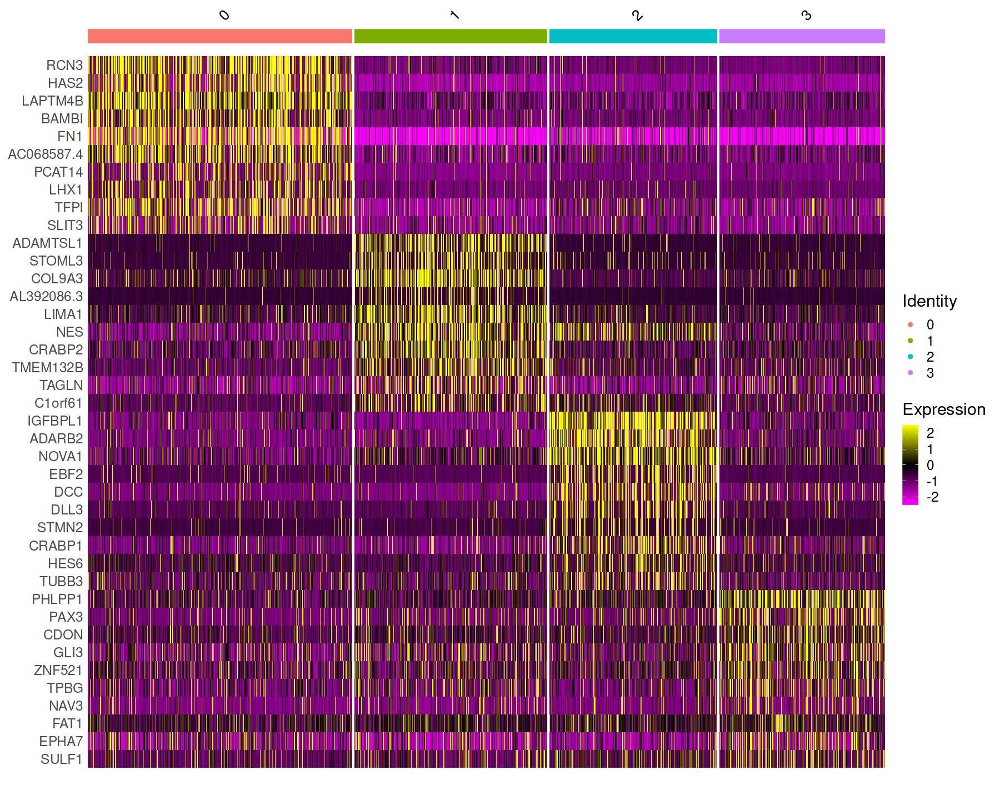

In [49]:
options(repr.plot.width = 15, repr.plot.height = 12)

markers %>%
    group_by(cluster) %>%
    top_n(n = 10, wt = avg_log2FC) -> top10
DoHeatmap(seurat.singlet, features = top10$gene) + theme(text = element_text(size = 18))

In [33]:
h5_name = '{PATH_TO_CATATAC_K562_CRISPR_ONLY_SINGLETS_H5SEURAT}'h5_w_gcap_name <- sub(".h5seurat", "_w_GUIDE_CAP_singlet.h5seurat", h5_name)

In [34]:

# SaveH5Seurat(seurat.singlet, h5_w_gcap_name, overwrite = TRUE, verbose = FALSE)

# Re-run SCT on singlets only

In [35]:
# DefaultAssay(seurat.singlet) <- "RNA"
# all.genes <- rownames(seurat.singlet)
# seurat.singlet <- ScaleData(seurat.singlet, features = all.genes)

In [36]:
# seurat.singlet <- FindNeighbors(seurat.singlet, dims = 1:9)
# seurat.singlet <- FindClusters(seurat.singlet, resolution = 0.5)
# seurat.singlet <- RunUMAP(seurat.singlet, dims = 1:9)

In [37]:
seurat.singlet <- SCTransform(seurat.singlet, verbose = FALSE) %>% 
          RunPCA() %>% 
          RunUMAP(dims = 1:4, reduction.name = 'umap.rna', reduction.key = 'rnaUMAP_')

PC_ 1 
Positive:  PTPRZ1, PTN, L1TD1, NES, SFRP1, TMEM132B, GRID2, BCAT1, RPLP1, CADM2 
	   RPL41, CDH6, VIM, FABP7, POLR3G, MGAT4C, POU5F1, RPS8, HSP90AB1, HMGB1 
	   RPS2, CLU, SFRP2, TAGLN, FGFBP3, ATP1A2, NASP, SYT1, AL392086.3, HSP90AA1 
Negative:  FN1, HAS2, TFPI, RCN3, PCDH7, SLIT3, AC068587.4, BAMBI, LAPTM4B, LHX1 
	   MEIS2, ZFPM2, CTNNA2, PCAT14, NKX2-5, IFI16, BMP4, KRT18, FOXP2, LRP1B 
	   S100A11, FAM184A, MYL7, GATA5, KIF26B, DGKB, NRP1, CD99, MECOM, SLC8A1 
PC_ 2 
Positive:  KRT18, TPM1, FN1, HMGB1, HSP90AB1, PTMA, RPL41, FST, L1TD1, HSP90AA1 
	   ID3, RPLP1, MT-ND1, MT-ND2, HAS2, SFRP2, APOE, RCN3, H2AFZ, RPS8 
	   ACTB, TUBA1B, TAGLN, NASP, BAMBI, RPL19, MT-ATP8, TOP2A, NPM1, KRT8 
Negative:  EBF2, DCC, IGFBPL1, STMN2, DLL3, TUBB3, ADARB2, MAP2, SRRM4, NEUROG2 
	   MALAT1, ELAVL3, KCNIP4, NAV2, SYT1, NOVA1, DCX, CACNA2D1, RUNX1T1, EBF1 
	   CADPS, THSD7A, EFNA5, ST18, KALRN, MAP1B, EBF3, LSAMP, ADGRL3, TAGLN3 
PC_ 3 
Positive:  TPM1, GPC3, MECOM, EPHA7, DACH1, TAGLN, C

In [38]:
# seurat.singlet <- FindVariableFeatures(seurat.singlet, selection.method = "vst", nfeatures = 3000)

In [39]:
seurat.singlet

An object of class Seurat 
337915 features across 4272 samples within 4 assays 
Active assay: SCT (25373 features, 3000 variable features)
 3 other assays present: ATAC, RNA, guidecapture
 7 dimensional reductions calculated: lsi, umap.atac, wnn.umap, pca, umap.rna, tsne, umap.guide

# Mixcape

In [40]:
# Setup custom theme for plotting.
custom_theme <- theme(
  plot.title = element_text(size=16, hjust = 0.5), 
  legend.key.size = unit(0.7, "cm"), 
  legend.text = element_text(size = 14))


In [41]:
#add cell cycle scoring to the seurat object
DefaultAssay(seurat.singlet) <- "SCT"
seurat.singlet <- CellCycleScoring(
  object = seurat.singlet,
  s.features = cc.genes$s.genes,
  g2m.features = cc.genes$g2m.genes,
  ctrl = NULL,
  set.ident = FALSE,
)
head(seurat.singlet[[]])

Warning message:
"The following features are not present in the object: MLF1IP, not searching for symbol synonyms"
Warning message:
"The following features are not present in the object: FAM64A, HN1, not searching for symbol synonyms"


,nCount_ATAC,nFeature_ATAC,nCount_RNA,nFeature_RNA,nCount_guidecapture,nFeature_guidecapture,orig.ident,percent.mt,nucleosome_signal,nucleosome_percentile,⋯,guidecapture_secondID,guidecapture_margin,guidecapture_classification,guidecapture_classification.global,hash.ID,old.ident,guidecapture_snn_res.0.2,S.Score,G2M.Score,Phase
,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<fct>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<dbl>,<chr>,<chr>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<chr>
AAACAGCCACCACAAC-1,7425,3511,11406,4023,48,3,CATATAC_CATATAC_5_CRISPR9,11.5,0.72,0.45,⋯,GATA5-1,0.88,NTCTL-2,Singlet,NTCTL-2,Singlet,0,0.16,0.068,S
AAACAGCCAGGGAGGA-1,12232,5861,23017,6010,104,4,CATATAC_CATATAC_5_CRISPR9,14.3,0.86,0.89,⋯,MEOX1-1,0.84,NTCTL-2,Singlet,NTCTL-2,Singlet,3,0.18,0.474,G2M
AAACAGCCATAGGCGA-1,10948,5232,10585,3919,114,3,CATATAC_CATATAC_5_CRISPR9,12.5,0.70,0.34,⋯,NEUROG2-1,0.95,GATA5-1,Singlet,GATA5-1,Singlet,0,0.46,-0.347,S
AAACAGCCATCCGTAA-1,18701,8520,20265,6139,127,5,CATATAC_CATATAC_5_CRISPR9,13.7,0.80,0.75,⋯,GATA5-1,1.04,MEOX1-2,Singlet,MEOX1-2,Singlet,1,-0.20,0.413,G2M
AAACATGCAACACTTG-1,9391,4598,7700,3708,159,4,CATATAC_CATATAC_5_CRISPR9,5.5,0.74,0.55,⋯,NEUROG2-1,1.15,NEUROG2-1_NEUROG2-2,Doublet,Doublet,Doublet,2,-0.13,0.485,G2M
AAACATGCAGGACACA-1,5136,2621,31272,7096,48,3,CATATAC_CATATAC_5_CRISPR9,10.7,0.78,0.69,⋯,MEOX1-1,0.91,GATA5-2,Singlet,GATA5-2,Singlet,0,-0.32,-0.361,G1


In [42]:
# A list of cell cycle markers, from Tirosh et al, 2015, is loaded with Seurat.  We can
# segregate this list into markers of G2/M phase and markers of S phase

s.genes <- cc.genes$s.genes
g2m.genes <- cc.genes$g2m.gene

seurat.singlet <- CellCycleScoring(seurat.singlet, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)

Warning message:
"The following features are not present in the object: MLF1IP, not searching for symbol synonyms"
Warning message:
"The following features are not present in the object: FAM64A, HN1, not searching for symbol synonyms"


Picking joint bandwidth of 0.112

Picking joint bandwidth of 0.111

Picking joint bandwidth of 0.0657

Picking joint bandwidth of 0.128



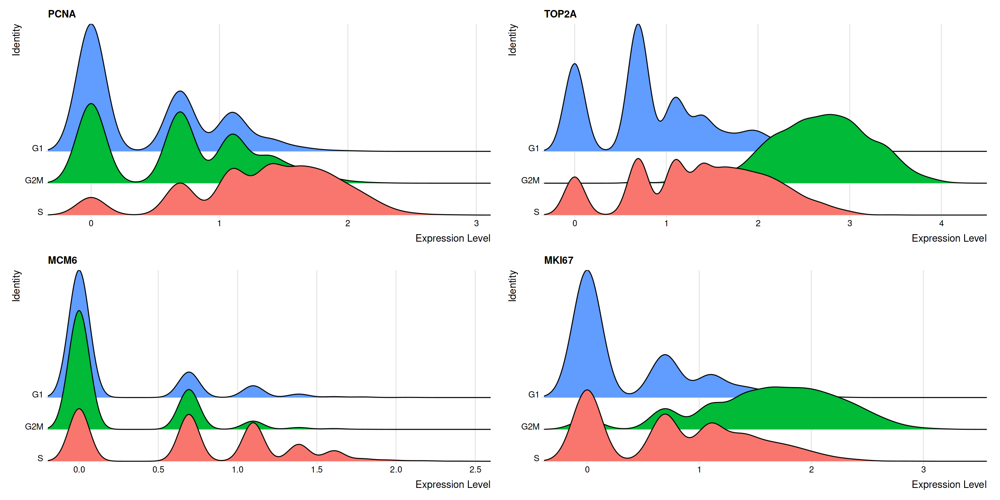

In [43]:
# Visualize the distribution of cell cycle markers across
RidgePlot(seurat.singlet, features = c("PCNA", "TOP2A", "MCM6", "MKI67"), ncol = 2)

# Visualizing cell cycle genes

Warning message in PrepDR(object = object, features = features, verbose = verbose):
"The following 45 features requested have not been scaled (running reduction without them): MCM5, FEN1, MCM2, RRM1, UNG, GINS2, MCM6, CDCA7, PRIM1, UHRF1, MLF1IP, RFC2, RPA2, RAD51AP1, GMNN, WDR76, SLBP, CCNE2, UBR7, POLD3, RAD51, RRM2, CDC45, EXO1, TIPIN, DSCC1, BLM, CASP8AP2, USP1, CHAF1B, E2F8, CKS2, CKS1B, TMPO, FAM64A, ANP32E, HJURP, HN1, RANGAP1, NCAPD2, PSRC1, LBR, CTCF, CBX5, CENPA"
Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
Warning message in irlba(A = t(x = object), nv = npcs, ...):
"did not converge--results might be invalid!; try increasing work or maxit"
Warning message:
"Requested number is larger than the number of available items (52). Setting to 52."
Warning message:
"Requested number is larger than the number of available items (52). Setting to 52."
Warning message:
"Reques

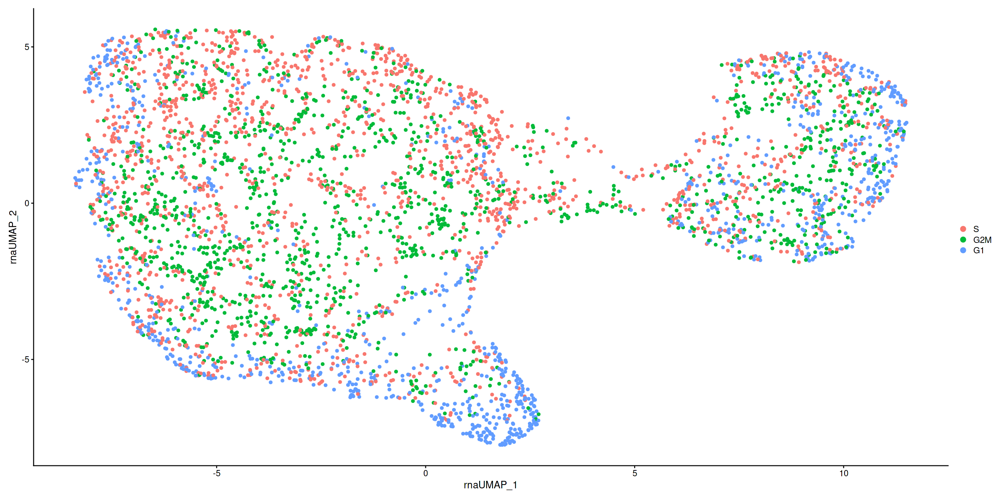

In [44]:
# perform visualization and clustering steps
DefaultAssay(seurat.singlet) <- "SCT"
# Running a PCA on cell cycle genes reveals, unsurprisingly, that cells separate entirely by
# phase
seurat.singlet <- RunPCA(seurat.singlet, features = c(s.genes, g2m.genes))
DimPlot(seurat.singlet,pt.size = 1.5)

Regressing out S.Score, G2M.Score

Centering and scaling data matrix

Warning message in PrepDR(object = object, features = features, verbose = verbose):
"The following 3 features requested have not been scaled (running reduction without them): MLF1IP, FAM64A, HN1"
Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
PC_ 1 
Positive:  HMGB2, CENPF, BIRC5, CKS1B, CCNB2, TUBB4B, PCNA, CDC20, TOP2A, NASP 
	   NUSAP1, UBE2C, CKS2, HMMR, TPX2, MKI67, DLGAP5, TYMS, GINS2, GMNN 
	   MCM2, LBR, RPA2, ANP32E, CDCA7, RFC2, TACC3, RRM1, SLBP, AURKB 
Negative:  CDCA2, KIF11, HJURP, KIF23, TTK, CDC25C, CDK1, ANLN, BRIP1, GAS2L3 
	   NDC80, CKAP2L, G2E3, ECT2, BLM, AURKA, CDCA8, DTL, EXO1, MSH2 
	   KIF20B, SMC4, USP1, CBX5, E2F8, BUB1, CDC6, POLA1, UBR7, KIF2C 
PC_ 2 
Positive:  UBE2C, CDK1, CKS1B, TUBB4B, CENPA, CKS2, AURKB, CDCA3, TYMS, GTSE1 
	   NDC80, AURKA, HJURP, CDCA8, SLBP, PSRC1, CDC25C

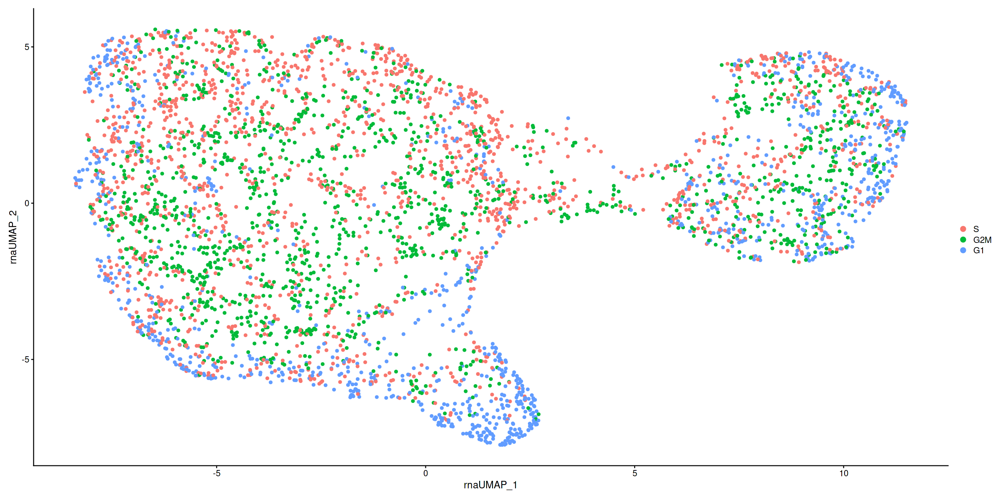

In [45]:
#Regress out the cell cycle genes
seurat.singlet <- ScaleData(seurat.singlet, vars.to.regress = c("S.Score", "G2M.Score"), features = rownames(seurat.singlet))
seurat.singlet <- RunPCA(seurat.singlet, features = c(s.genes, g2m.genes))
DimPlot(seurat.singlet,pt.size = 1.5)

In [46]:
seurat.singlet$guidecapture_classification

AAACAGCCACCACAAC-1    AAACAGCCAGGGAGGA-1    AAACAGCCATAGGCGA-1 
            "NTCTL-2"             "NTCTL-2"             "GATA5-1" 
   AAACAGCCATCCGTAA-1    AAACATGCAACACTTG-1    AAACATGCAGGACACA-1 
            "MEOX1-2" "NEUROG2-1_NEUROG2-2"             "GATA5-2" 
   AAACATGCAGTAAAGC-1    AAACCGAAGAAGGTGC-1    AAACCGAAGACTTATG-1 
    "MEOX1-1_MEOX1-2"             "GATA5-2"     "GATA5-1_GATA5-2" 
   AAACCGAAGCGTGCGT-1    AAACCGAAGTCTTGAA-1    AAACCGAAGTGAGGGT-1 
    "NTCTL-1_NTCTL-2"     "MEOX1-1_MEOX1-2"             "GATA5-2" 
   AAACCGCGTATACTGG-1    AAACCGCGTGTTTGAG-1    AAACCGCGTTTACTTG-1 
          "NEUROG2-1"             "NTCTL-2"     "NTCTL-1_NTCTL-2" 
   AAACCGGCACAGCCTG-1    AAACCGGCACATTAAC-1    AAACCGGCACGAATTT-1 
            "GATA5-2"             "GATA5-2"             "MEOX1-2" 
   AAACCGGCATCCTGAA-1    AAACGCGCACCAGCAT-1    AAACGCGCAGGCTTGT-1 
            "NTCTL-2"     "MEOX1-1_MEOX1-2"             "NTCTL-2" 
   AAACGCGCATCACAGC-1    AAACGGATCAAACCTA-1    AAACGGATCCTGGTCT-1 
            "GATA5-1"             "MEOX1-2"     "MEOX1-1_MEOX1-2" 
   AAACGTACAGGTTATT-1    AAACGTACATCTAGCA-1    AAACGTACATTAAGTC-1 
"NEUROG2-1_NEUROG2-2"             "MEOX1-2"     "MEOX1-1_MEOX1-2" 
   AAACGTACATTGTGAT-1    AAAGCAAGTCATTAGG-1    AAAGCACCAAGGACCA-1 
    "MEOX1-1_MEOX1-2"     "MEOX1-1_MEOX1-2"             "GATA5-1" 
   AAAGCACCACACTAAT-1    AAAGCACCACTTCACT-1    AAAGCACCAGAATGAC-1 
            "NTCTL-2"     "NTCTL-1_NTCTL-2"             "MEOX1-1" 
   AAAGCACCATTGCGAC-1    AAAGCCCGTGTTGCAA-1    AAAGCCGCAGGCTACT-1 
            "MEOX1-1"             "GATA5-2"             "GATA5-2" 
   AAAGCCGCAGTAAAGC-1    AAAGCGGGTTCCTCCT-1    AAAGCGGGTTGGTGAC-1 
            "MEOX1-1"             "MEOX1-2"             "NTCTL-2" 
   AAAGCTTGTTAAGCCA-1    AAAGCTTGTTATAGCG-1    AAAGCTTGTTCATTTG-1 
    "GATA5-1_GATA5-2"     "GATA5-1_GATA5-2" "NEUROG2-1_NEUROG2-2" 
   AAAGGACGTATTGAGT-1    AAAGGAGCACGGTTTA-1    AAAGGAGCATCACAGC-1 
            "MEOX1-1"     "NTCTL-1_NTCTL-2"             "GATA5-1" 
   AAAGGAGCATCACTTC-1    AAAGGAGCATCCCTCA-1    AAAGGAGCATGTCAGC-1 
    "GATA5-1_GATA5-2"     "GATA5-1_GATA5-2"     "NTCTL-1_NTCTL-2" 
   AAAGGCTCACGTTACA-1    AAAGGCTCAGGATAAC-1    AAAGGTTAGAGGCTAA-1 
            "MEOX1-1"     "MEOX1-1_MEOX1-2"             "NTCTL-2" 
   AAAGGTTAGGAATAAC-1    AAAGGTTAGTGAGGTA-1    AAATCCGGTAAAGCGG-1 
            "NTCTL-2"             "GATA5-1"     "MEOX1-1_MEOX1-2" 
   AAATGCCTCCTAAGAC-1    AAATGGCCAAATTGCT-1    AAATGGCCAAGCGAGC-1 
    "GATA5-1_GATA5-2"     "NTCTL-1_NTCTL-2"     "NTCTL-1_NTCTL-2" 
   AAATGGCCACGGTACT-1    AACAAAGGTAACGGGA-1    AACAAAGGTCCCGGAA-1 
    "MEOX1-1_MEOX1-2"             "GATA5-1"     "MEOX1-1_MEOX1-2" 
   AACAAAGGTTCCTGAT-1    AACAAAGGTTGCATCT-1    AACAAGCCAGCTAACC-1 
"NEUROG2-1_NEUROG2-2" "NEUROG2-1_NEUROG2-2"             "GATA5-2" 
   AACAGATAGATTGAGG-1    AACAGATAGGCCTTAG-1    AACAGATAGTCGCTAG-1 
          "NEUROG2-2"     "MEOX1-1_MEOX1-2"     "MEOX1-1_MEOX1-2" 
   AACAGCAAGACAAACG-1    AACAGCAAGTAACCAC-1    AACAGGATCCTTAATC-1 
    "MEOX1-1_MEOX1-2"     "MEOX1-1_MEOX1-2"     "MEOX1-1_MEOX1-2" 
   AACAGGATCGCTAGCA-1    AACAGGATCGTGCTTC-1    AACATAGCAATAAGCA-1 
            "GATA5-2"             "MEOX1-2"     "MEOX1-1_MEOX1-2" 
   AACATAGCACAGCCAT-1    AACATCATCCTGAGTG-1    AACATTGTCAATGTCA-1 
"NEUROG2-1_NEUROG2-2"     "GATA5-1_GATA5-2"             "NTCTL-2" 
   AACATTGTCCTTAATC-1    AACCCGCAGTATTGGC-1    AACCCGCAGTCACCTC-1 
            "NTCTL-2"             "NTCTL-1"     "GATA5-1_GATA5-2" 
   AACCGCTCACCTGTAA-1    AACCGCTCAGGACCTT-1    AACCGGCTCCTTAGTT-1 
            "MEOX1-1"             "GATA5-1"     "GATA5-1_GATA5-2" 
   AACCGGCTCGCACAAT-1    AACCTAATCGTTAAGC-1    AACCTAATCTTTAGGA-1 
          "NEUROG2-1"             "GATA5-2"             "GATA5-2" 
   AACCTCACATGTTGCA-1    AACCTCCTCGTCAAGT-1    AACCTCCTCTTGAGGT-1 
"NEUROG2-1_NEUROG2-2"             "NTCTL-1" "NEUROG2-1_NEUROG2-2" 
   AACCTTGCAAGGTGCA-1    AACCTTGCACTAAATC-1    AACGACAAGCGCTCAA-1 
"NEUROG2-1_NEUROG2-2"             "GATA5-1"     "G

In [47]:
#create metadata of perturbed vs non-perturbed cells

seurat.singlet@meta.data$isNT <- seurat.singlet@meta.data$guidecapture_classification %in% c('NTCTL-1', 'NTCTL-2',
                                                                                            'NTCTL-1_NTCTL-2')



In [48]:
seurat.singlet$Perturbation <- ifelse(seurat.singlet$guidecapture_classification %in% c('NTCTL-1', 'NTCTL-2',
                                                                                            'NTCTL-1_NTCTL-2'), "NT", "Perturbed")
seurat.singlet$Perturbation

AAACAGCCACCACAAC-1 AAACAGCCAGGGAGGA-1 AAACAGCCATAGGCGA-1 AAACAGCCATCCGTAA-1 
              "NT"               "NT"        "Perturbed"        "Perturbed" 
AAACATGCAACACTTG-1 AAACATGCAGGACACA-1 AAACATGCAGTAAAGC-1 AAACCGAAGAAGGTGC-1 
       "Perturbed"        "Perturbed"        "Perturbed"        "Perturbed" 
AAACCGAAGACTTATG-1 AAACCGAAGCGTGCGT-1 AAACCGAAGTCTTGAA-1 AAACCGAAGTGAGGGT-1 
       "Perturbed"               "NT"        "Perturbed"        "Perturbed" 
AAACCGCGTATACTGG-1 AAACCGCGTGTTTGAG-1 AAACCGCGTTTACTTG-1 AAACCGGCACAGCCTG-1 
       "Perturbed"               "NT"               "NT"        "Perturbed" 
AAACCGGCACATTAAC-1 AAACCGGCACGAATTT-1 AAACCGGCATCCTGAA-1 AAACGCGCACCAGCAT-1 
       "Perturbed"        "Perturbed"               "NT"        "Perturbed" 
AAACGCGCAGGCTTGT-1 AAACGCGCATCACAGC-1 AAACGGATCAAACCTA-1 AAACGGATCCTGGTCT-1 
              "NT"        "Perturbed"        "Perturbed"        "Perturbed" 
AAACGTACAGGTTATT-1 AAACGTACATCTAGCA-1 AAACGTACATTAAGTC-1 AAACGTACATTGTGAT-1 
       "Perturbed"        "Perturbed"        "Perturbed"        "Perturbed" 
AAAGCAAGTCATTAGG-1 AAAGCACCAAGGACCA-1 AAAGCACCACACTAAT-1 AAAGCACCACTTCACT-1 
       "Perturbed"        "Perturbed"               "NT"               "NT" 
AAAGCACCAGAATGAC-1 AAAGCACCATTGCGAC-1 AAAGCCCGTGTTGCAA-1 AAAGCCGCAGGCTACT-1 
       "Perturbed"        "Perturbed"        "Perturbed"        "Perturbed" 
AAAGCCGCAGTAAAGC-1 AAAGCGGGTTCCTCCT-1 AAAGCGGGTTGGTGAC-1 AAAGCTTGTTAAGCCA-1 
       "Perturbed"        "Perturbed"               "NT"        "Perturbed" 
AAAGCTTGTTATAGCG-1 AAAGCTTGTTCATTTG-1 AAAGGACGTATTGAGT-1 AAAGGAGCACGGTTTA-1 
       "Perturbed"        "Perturbed"        "Perturbed"               "NT" 
AAAGGAGCATCACAGC-1 AAAGGAGCATCACTTC-1 AAAGGAGCATCCCTCA-1 AAAGGAGCATGTCAGC-1 
       "Perturbed"        "Perturbed"        "Perturbed"               "NT" 
AAAGGCTCACGTTACA-1 AAAGGCTCAGGATAAC-1 AAAGGTTAGAGGCTAA-1 AAAGGTTAGGAATAAC-1 
       "Perturbed"        "Perturbed"               "NT"               "NT" 
AAAGGTTAGTGAGGTA-1 AAATCCGGTAAAGCGG-1 AAATGCCTCCTAAGAC-1 AAATGGCCAAATTGCT-1 
       "Perturbed"        "Perturbed"        "Perturbed"               "NT" 
AAATGGCCAAGCGAGC-1 AAATGGCCACGGTACT-1 AACAAAGGTAACGGGA-1 AACAAAGGTCCCGGAA-1 
              "NT"        "Perturbed"        "Perturbed"        "Perturbed" 
AACAAAGGTTCCTGAT-1 AACAAAGGTTGCATCT-1 AACAAGCCAGCTAACC-1 AACAGATAGATTGAGG-1 
       "Perturbed"        "Perturbed"        "Perturbed"        "Perturbed" 
AACAGATAGGCCTTAG-1 AACAGATAGTCGCTAG-1 AACAGCAAGACAAACG-1 AACAGCAAGTAACCAC-1 
       "Perturbed"        "Perturbed"        "Perturbed"        "Perturbed" 
AACAGGATCCTTAATC-1 AACAGGATCGCTAGCA-1 AACAGGATCGTGCTTC-1 AACATAGCAATAAGCA-1 
       "Perturbed"        "Perturbed"        "Perturbed"        "Perturbed" 
AACATAGCACAGCCAT-1 AACATCATCCTGAGTG-1 AACATTGTCAATGTCA-1 AACATTGTCCTTAATC-1 
       "Perturbed"        "Perturbed"               "NT"               "NT" 
AACCCGCAGTATTGGC-1 AACCCGCAGTCACCTC-1 AACCGCTCACCTGTAA-1 AACCGCTCAGGACCTT-1 
              "NT"        "Perturbed"        "Perturbed"        "Perturbed" 
AACCGGCTCCTTAGTT-1 AACCGGCTCGCACAAT-1 AACCTAATCGTTAAGC-1 AACCTAATCTTTAGGA-1 
       "Perturbed"        "Perturbed"        "Perturbed"        "Perturbed" 
AACCTCACATGTTGCA-1 AACCTCCTCGTCAAGT-1 AACCTCCTCTTGAGGT-1 AACCTTGCAAGGTGCA-1 
       "Perturbed"               "NT"        "Perturbed"        "Perturbed" 
AACCTTGCACTAAATC-1 AACGACAAGCGCTCAA-1 AACGACAAGGAGTCTT-1 AACGACAAGGCCTTAG-1 
       "Perturbed"        "Perturbed"        "Perturbed"        "Perturbed" 
AACGACAAGGCTACTG-1 AACGCCCAGCCGCTAA-1 AACGCTAGTAAGGTCC-1 AACGCTAGTCATGAGC-1 
       "Perturbed"        "Perturbed"               "NT"        "Perturbed" 
AACGCTAGTCATGCAA-1 AACTACTCACAATACT-1 AACTACTCAGTAATAG-1 AACTACTCAGTTATCG-1 
       "Perturbed"               "NT"        "Perturbed"        "Perturbed" 
AACTACTCATTCCTCG-1 AACTAGCTCAGGAACA-1 AACTAGCTCCGCAAGC-1 AACTAGCTCTTACTCG-1 
       "Perturbed"        "Perturbed"        "Perturbed"        "Perturbe

In [49]:
seurat.singlet <- SetIdent(seurat.singlet, value = seurat.singlet@meta.data$guidecapture_classification)
DefaultAssay(seurat.singlet) <- "SCT"

guide_genes <- c("NEUROG2", "GATA5", "MEOX1")
perc_exp <- DotPlot(seurat.singlet, features=guide_genes)$data[, c("features.plot", "id", "pct.exp")]
perc_exp




,features.plot,id,pct.exp
,<fct>,<fct>,<dbl>
NEUROG2,NEUROG2,NTCTL-2,2.08
GATA5,GATA5,NTCTL-2,5.93
MEOX1,MEOX1,NTCTL-2,0.59
NEUROG21,NEUROG2,GATA5-1,3.77
GATA51,GATA5,GATA5-1,47.64
MEOX11,MEOX1,GATA5-1,0.94
NEUROG22,NEUROG2,MEOX1-2,2.91
GATA52,GATA5,MEOX1-2,7.14
MEOX12,MEOX1,MEOX1-2,13.49


In [50]:
avg_exp <- DotPlot(seurat.singlet, features=guide_genes)$data[, c("features.plot", "id", "avg.exp")]
avg_exp

,features.plot,id,avg.exp
,<fct>,<fct>,<dbl>
NEUROG2,NEUROG2,NTCTL-2,0.0208
GATA5,GATA5,NTCTL-2,0.1039
MEOX1,MEOX1,NTCTL-2,0.0089
NEUROG21,NEUROG2,GATA5-1,0.0519
GATA51,GATA5,GATA5-1,1.2170
MEOX11,MEOX1,GATA5-1,0.0094
NEUROG22,NEUROG2,MEOX1-2,0.0714
GATA52,GATA5,MEOX1-2,0.1164
MEOX12,MEOX1,MEOX1-2,0.2460


# Plotting perturbation

In [51]:
#specify factor level order
perc_exp$id = factor(perc_exp$id, levels = c("NEUROG2-1", "NEUROG2-2", "NEUROG2-1_NEUROG2-2",
                                                     "GATA5-1", "GATA5-2", "GATA5-1_GATA5-2",
                                                    "MEOX1-1", "MEOX1-2", "MEOX1-1_MEOX1-2",
                                                     "NTCTL-1", "NTCTL-2", "NTCTL-1_NTCTL-2"))


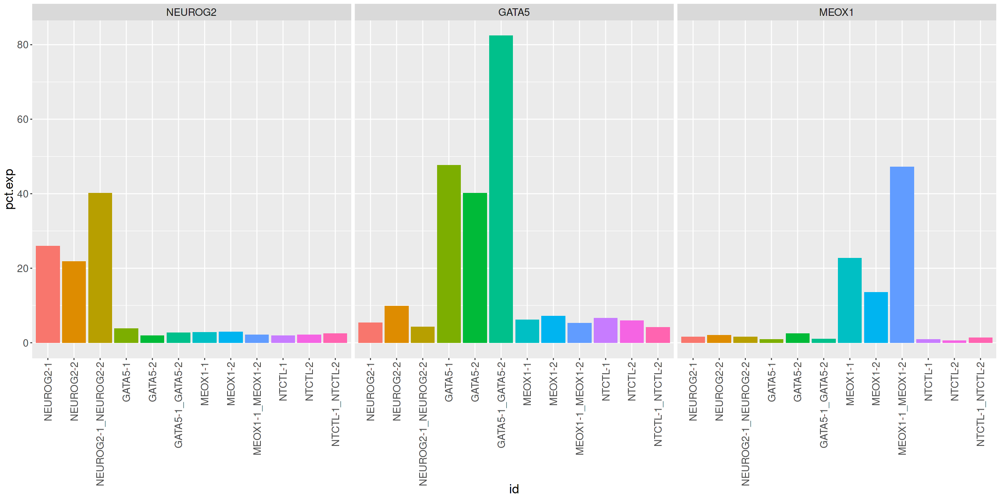

In [52]:
options(repr.plot.width = 20, repr.plot.height = 10)
ggplot(perc_exp, aes(x=id, y=pct.exp, fill=id)) +
  geom_col() +
  facet_wrap(~features.plot) + 
   theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1), text = element_text(size = 18)) +
  NoLegend()

In [53]:
#specify factor level order
avg_exp$id = factor(avg_exp$id, levels = c("NEUROG2-1", "NEUROG2-2", "NEUROG2-1_NEUROG2-2",
                                                     "GATA5-1", "GATA5-2", "GATA5-1_GATA5-2",
                                                    "MEOX1-1", "MEOX1-2", "MEOX1-1_MEOX1-2",
                                                     "NTCTL-1", "NTCTL-2", "NTCTL-1_NTCTL-2"))


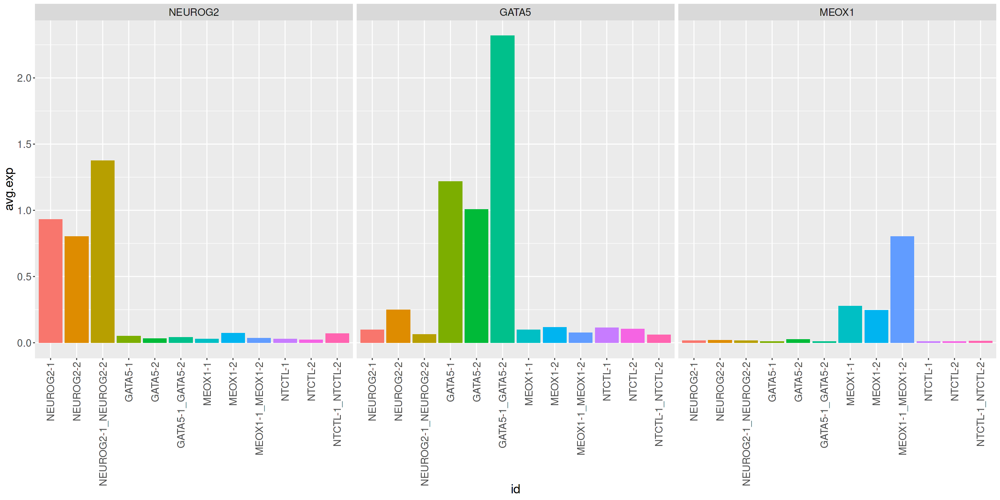

In [54]:
ggplot(avg_exp, aes(x=id, y=avg.exp, fill=id)) +
  geom_col() +
  facet_wrap(~features.plot) + 
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1), text = element_text(size = 18)) +
  NoLegend()


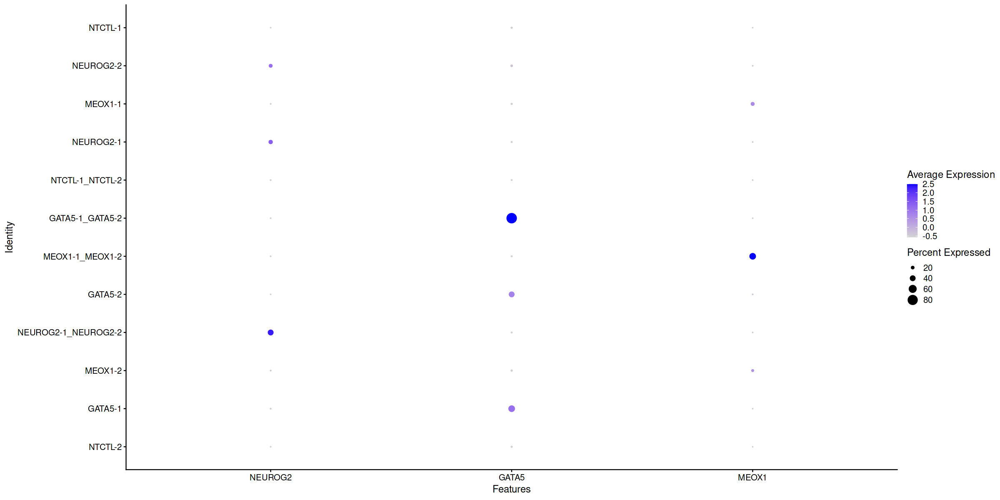

In [55]:
guide_genes <- c("NEUROG2", "GATA5", "MEOX1")
DotPlot(seurat.singlet, features=guide_genes)

custom_theme <- theme(
  plot.title = element_text(size=20, hjust = 0.5), 
  legend.key.size = unit(1, "cm"), 
  legend.text = element_text(size = 14))

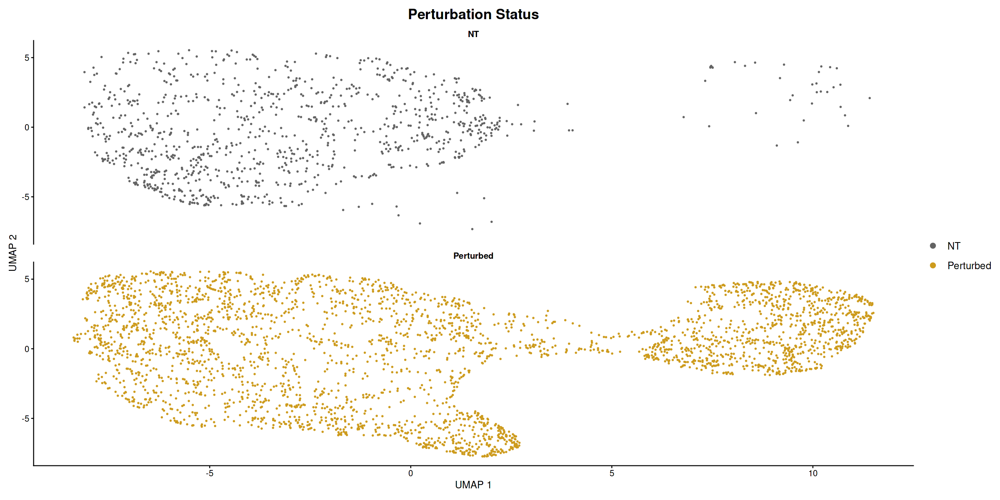

In [56]:
p15 <- DimPlot(
  object = seurat.singlet, 
  group.by = 'Perturbation', 
  pt.size = 0.5, 
  reduction = "umap.rna", 
  split.by = "Perturbation", 
  ncol = 1, 
  cols = c("grey39","goldenrod3")) + 
  ggtitle("Perturbation Status") +
  ylab("UMAP 2") +
  xlab("UMAP 1") +
  custom_theme
# Visualize plots.
p15


In [57]:
seurat.singlet$guidecapture_classification[seurat.singlet$isNT] <- "NT"

seurat.singlet$guidecapture_classification

AAACAGCCACCACAAC-1    AAACAGCCAGGGAGGA-1    AAACAGCCATAGGCGA-1 
                 "NT"                  "NT"             "GATA5-1" 
   AAACAGCCATCCGTAA-1    AAACATGCAACACTTG-1    AAACATGCAGGACACA-1 
            "MEOX1-2" "NEUROG2-1_NEUROG2-2"             "GATA5-2" 
   AAACATGCAGTAAAGC-1    AAACCGAAGAAGGTGC-1    AAACCGAAGACTTATG-1 
    "MEOX1-1_MEOX1-2"             "GATA5-2"     "GATA5-1_GATA5-2" 
   AAACCGAAGCGTGCGT-1    AAACCGAAGTCTTGAA-1    AAACCGAAGTGAGGGT-1 
                 "NT"     "MEOX1-1_MEOX1-2"             "GATA5-2" 
   AAACCGCGTATACTGG-1    AAACCGCGTGTTTGAG-1    AAACCGCGTTTACTTG-1 
          "NEUROG2-1"                  "NT"                  "NT" 
   AAACCGGCACAGCCTG-1    AAACCGGCACATTAAC-1    AAACCGGCACGAATTT-1 
            "GATA5-2"             "GATA5-2"             "MEOX1-2" 
   AAACCGGCATCCTGAA-1    AAACGCGCACCAGCAT-1    AAACGCGCAGGCTTGT-1 
                 "NT"     "MEOX1-1_MEOX1-2"                  "NT" 
   AAACGCGCATCACAGC-1    AAACGGATCAAACCTA-1    AAACGGATCCTGGTCT-1 
            "GATA5-1"             "MEOX1-2"     "MEOX1-1_MEOX1-2" 
   AAACGTACAGGTTATT-1    AAACGTACATCTAGCA-1    AAACGTACATTAAGTC-1 
"NEUROG2-1_NEUROG2-2"             "MEOX1-2"     "MEOX1-1_MEOX1-2" 
   AAACGTACATTGTGAT-1    AAAGCAAGTCATTAGG-1    AAAGCACCAAGGACCA-1 
    "MEOX1-1_MEOX1-2"     "MEOX1-1_MEOX1-2"             "GATA5-1" 
   AAAGCACCACACTAAT-1    AAAGCACCACTTCACT-1    AAAGCACCAGAATGAC-1 
                 "NT"                  "NT"             "MEOX1-1" 
   AAAGCACCATTGCGAC-1    AAAGCCCGTGTTGCAA-1    AAAGCCGCAGGCTACT-1 
            "MEOX1-1"             "GATA5-2"             "GATA5-2" 
   AAAGCCGCAGTAAAGC-1    AAAGCGGGTTCCTCCT-1    AAAGCGGGTTGGTGAC-1 
            "MEOX1-1"             "MEOX1-2"                  "NT" 
   AAAGCTTGTTAAGCCA-1    AAAGCTTGTTATAGCG-1    AAAGCTTGTTCATTTG-1 
    "GATA5-1_GATA5-2"     "GATA5-1_GATA5-2" "NEUROG2-1_NEUROG2-2" 
   AAAGGACGTATTGAGT-1    AAAGGAGCACGGTTTA-1    AAAGGAGCATCACAGC-1 
            "MEOX1-1"                  "NT"             "GATA5-1" 
   AAAGGAGCATCACTTC-1    AAAGGAGCATCCCTCA-1    AAAGGAGCATGTCAGC-1 
    "GATA5-1_GATA5-2"     "GATA5-1_GATA5-2"                  "NT" 
   AAAGGCTCACGTTACA-1    AAAGGCTCAGGATAAC-1    AAAGGTTAGAGGCTAA-1 
            "MEOX1-1"     "MEOX1-1_MEOX1-2"                  "NT" 
   AAAGGTTAGGAATAAC-1    AAAGGTTAGTGAGGTA-1    AAATCCGGTAAAGCGG-1 
                 "NT"             "GATA5-1"     "MEOX1-1_MEOX1-2" 
   AAATGCCTCCTAAGAC-1    AAATGGCCAAATTGCT-1    AAATGGCCAAGCGAGC-1 
    "GATA5-1_GATA5-2"                  "NT"                  "NT" 
   AAATGGCCACGGTACT-1    AACAAAGGTAACGGGA-1    AACAAAGGTCCCGGAA-1 
    "MEOX1-1_MEOX1-2"             "GATA5-1"     "MEOX1-1_MEOX1-2" 
   AACAAAGGTTCCTGAT-1    AACAAAGGTTGCATCT-1    AACAAGCCAGCTAACC-1 
"NEUROG2-1_NEUROG2-2" "NEUROG2-1_NEUROG2-2"             "GATA5-2" 
   AACAGATAGATTGAGG-1    AACAGATAGGCCTTAG-1    AACAGATAGTCGCTAG-1 
          "NEUROG2-2"     "MEOX1-1_MEOX1-2"     "MEOX1-1_MEOX1-2" 
   AACAGCAAGACAAACG-1    AACAGCAAGTAACCAC-1    AACAGGATCCTTAATC-1 
    "MEOX1-1_MEOX1-2"     "MEOX1-1_MEOX1-2"     "MEOX1-1_MEOX1-2" 
   AACAGGATCGCTAGCA-1    AACAGGATCGTGCTTC-1    AACATAGCAATAAGCA-1 
            "GATA5-2"             "MEOX1-2"     "MEOX1-1_MEOX1-2" 
   AACATAGCACAGCCAT-1    AACATCATCCTGAGTG-1    AACATTGTCAATGTCA-1 
"NEUROG2-1_NEUROG2-2"     "GATA5-1_GATA5-2"                  "NT" 
   AACATTGTCCTTAATC-1    AACCCGCAGTATTGGC-1    AACCCGCAGTCACCTC-1 
                 "NT"                  "NT"     "GATA5-1_GATA5-2" 
   AACCGCTCACCTGTAA-1    AACCGCTCAGGACCTT-1    AACCGGCTCCTTAGTT-1 
            "MEOX1-1"             "GATA5-1"     "GATA5-1_GATA5-2" 
   AACCGGCTCGCACAAT-1    AACCTAATCGTTAAGC-1    AACCTAATCTTTAGGA-1 
          "NEUROG2-1"             "GATA5-2"             "GATA5-2" 
   AACCTCACATGTTGCA-1    AACCTCCTCGTCAAGT-1    AACCTCCTCTTGAGGT-1 
"NEUROG2-1_NEUROG2-2"                  "NT" "NEUROG2-1_NEUROG2-2" 
   AACCTTGCAAGGTGCA-1    AACCTTGCACTAAATC-1    AACGACAAGCGCTCAA-1 
"NEUROG2-1_NEUROG2-2"             "GATA5-1"     "G

# Running mixcape

In [58]:
#Calculate perturbation signature

seurat.singlet <- CalcPerturbSig(
  object = seurat.singlet, 
  assay = "SCT", 
  slot = "data", 
  gd.class ="guidecapture_classification", 
  nt.cell.class = "NT", 
  reduction = "pca", 
  ndims = 4, 
  num.neighbors = 20, 
  new.assay.name = "PRTB")

Processing rep1



In [59]:
# Prepare PRTB assay for dimensionality reduction: 
# Normalize data, find variable features and center data.
DefaultAssay(object = seurat.singlet) <- 'PRTB'

In [60]:
# Use variable features from RNA assay.
VariableFeatures(object = seurat.singlet) <- VariableFeatures(object = seurat.singlet[["SCT"]])
seurat.singlet <- ScaleData(object = seurat.singlet, do.scale = F, do.center = T)

Centering data matrix



In [61]:
DefaultAssay(seurat.singlet) <- "SCT"
seurat.singlet

An object of class Seurat 
340915 features across 4272 samples within 5 assays 
Active assay: SCT (25373 features, 3000 variable features)
 4 other assays present: ATAC, RNA, guidecapture, PRTB
 7 dimensional reductions calculated: lsi, umap.atac, wnn.umap, pca, umap.rna, tsne, umap.guide

In [62]:
# Run PCA to reduce the dimensionality of the data.
seurat.singlet <- RunPCA(object = seurat.singlet, reduction.key = 'prtbpca', reduction.name = 'prtbpca')


Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prtbpca to prtbpca_"
Warning message:
"All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to prtbpca_"
prtbpca_ 1 
Positive:  SYT1, PTPRZ1, BCAT1, SFRP1, MAP2, PTN, CADM2, NES, MARCKS, NOVA1 
	   IGDCC3, SOX2, IGFBP2, VIM, RPL17, TCF4, RPLP1, MAPK10, RPL10, NLGN1 
	   RPS3, ATP1A2, CLU, RPS2, CDH6, FABP7, TENM3, TMSB15A, BASP1, TTYH1 
Negative:  FN1, HAS2, RCN3, GATA5, AC068587.4, LAPTM4B, BAMBI, PRDM1, FAM89A, PKP2 
	   LHX1, TBX3, BMP4, ARHGAP29, S100A11, MYL7, GPAT3, FAM184A, IFI16, AC105916.1 
	   ATP23, MEIS2, TFPI, C1GALT1, ZFPM2, FOXC1, KRT18, PCAT14, ISL1, CGNL1 
prtbpca_ 2 
Positive:  EBF2, STMN2, NAV2, ELAVL3, CACNA2D1, MALAT1, DCX, FMN2, RIMS2, SRRM4 
	   TCF12, PSD3, AFAP1, ST18, FGD4, NCOA1, CADPS, SYN3, EXOC4, DCC 
	   XKR4, CTNND2, KALRN, MAGI1, EBF1, SCG3, UNCX, NCAM1, DLL3, NBEA 
Negative:  RPL19, RPL41, RPL35, 

In [63]:
# Run UMAP to visualize clustering in 2-D.
seurat.singlet <- RunUMAP(
  object = seurat.singlet, 
  dims = 1:4, 
  reduction = 'prtbpca', 
  reduction.key = 'prtbumap', 
  reduction.name = 'prtbumap')

11:39:35 UMAP embedding parameters a = 0.9922 b = 1.112

11:39:35 Read 4272 rows and found 4 numeric columns

11:39:35 Using Annoy for neighbor search, n_neighbors = 30

11:39:35 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

11:39:36 Writing NN index file to temp file /tmp/RtmpSiTNo7/file3c9d2c5670e6ce

11:39:36 Searching Annoy index using 10 threads, search_k = 3000

11:39:36 Annoy recall = 100%

11:39:37 Commencing smooth kNN distance calibration using 10 threads
 with target n_neighbors = 30

11:39:39 Initializing from normalized Laplacian + noise (using irlba)

11:39:39 Commencing optimization for 500 epochs, with 151808 positive edges

11:39:44 Optimization finished

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, 

In [64]:
# Generate plots to check if clustering is driven by biological replicate ID, 
# cell cycle phase or target gene class.

q2 <- DimPlot(
  object = seurat.singlet, 
  group.by = 'Phase', 
  reduction = 'prtbumap', 
  pt.size = 0.2, label = F, repel = T) +
  ggtitle("Cell Cycle Phase") +
  ylab("UMAP 2") +
  xlab("UMAP 1") + 
  custom_theme

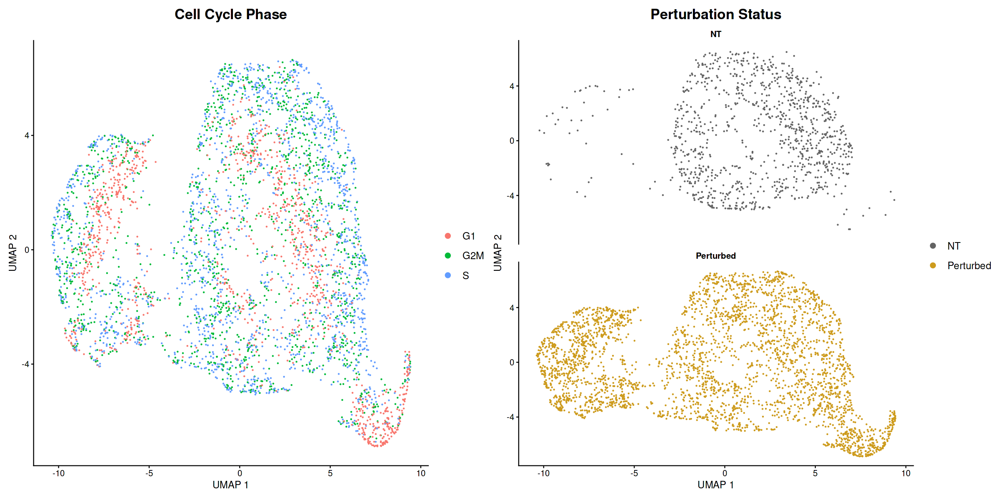

In [65]:
q3 <- DimPlot(
  object = seurat.singlet,
  group.by = 'Perturbation',
  reduction = 'prtbumap', 
  split.by = "Perturbation", 
  ncol = 1, 
  pt.size = 0.2, 
  cols = c("grey39","goldenrod3")) +
  ggtitle("Perturbation Status") +
  ylab("UMAP 2") +
  xlab("UMAP 1") +
  custom_theme
# Visualize plots.
(q2 + plot_layout(guides = 'auto') | q3)


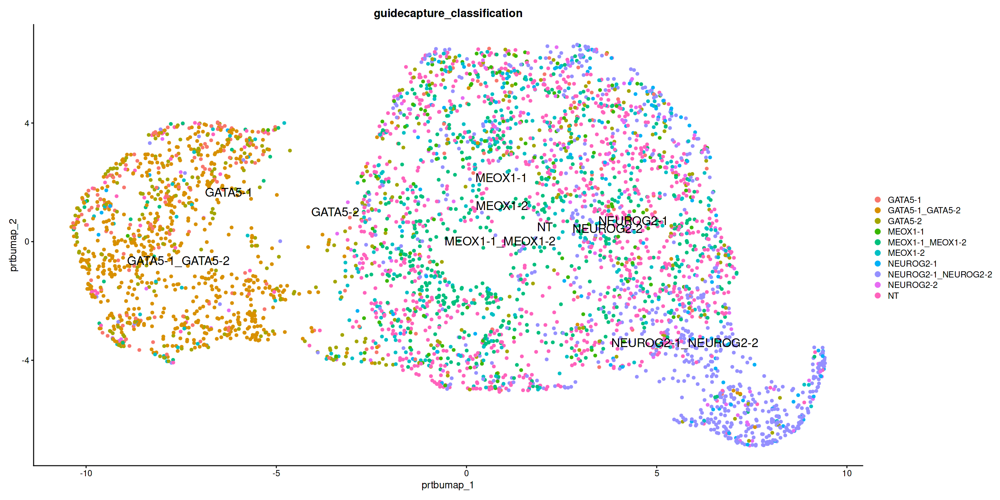

In [66]:
DimPlot(
  object = seurat.singlet,
  group.by = 'guidecapture_classification',
  reduction = 'prtbumap', 
  ncol = 1, 
  pt.size = 1.5,
  label = TRUE,
  label.size = 6) 

In [67]:
# Run mixscape.
seurat.singlet <- RunMixscape(
  object = seurat.singlet, 
  assay = "PRTB", 
  slot = "scale.data", 
  labels = "guidecapture_classification", 
  nt.class.name = "NT", 
  new.class.name = "mixscape_class",
  min.de.genes = 2,                ## changed from 5 to 2
  iter.num = 10, 
  de.assay = "SCT",
  logfc.threshold = 0.25,
  verbose = F,
  prtb.type = "KD")

Warning message:
"The following arguments are not used: norm.method"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"The following arguments are not used: norm.method"


number of iterations= 14 
number of iterations= 10 
number of iterations= 34 
number of iterations= 29 
number of iterations= 27 
number of iterations= 26 
number of iterations= 26 
number of iterations= 23 
number of iterations= 22 
number of iterations= 22 
number of iterations= 23 
number of iterations= 23 
number of iterations= 16 
number of iterations= 10 
number of iterations= 10 
number of iterations= 10 
number of iterations= 18 
number of iterations= 17 
number of iterations= 8 
number of iterations= 5 
number of iterations= 28 
number of iterations= 25 
number of iterations= 24 
number of iterations= 54 
number of iterations= 46 
number of iterations= 45 
number of iterations= 36 
number of iterations= 31 
number of iterations= 31 
number of iterations= 31 


In [68]:
head(seurat.singlet[[]])

,nCount_ATAC,nFeature_ATAC,nCount_RNA,nFeature_RNA,nCount_guidecapture,nFeature_guidecapture,orig.ident,percent.mt,nucleosome_signal,nucleosome_percentile,⋯,old.ident,guidecapture_snn_res.0.2,S.Score,G2M.Score,Phase,isNT,Perturbation,mixscape_class,mixscape_class_p_kd,mixscape_class.global
,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<fct>,<dbl>,<dbl>,<dbl>,⋯,<fct>,<fct>,<dbl>,<dbl>,<chr>,<lgl>,<chr>,<chr>,<dbl>,<chr>
AAACAGCCACCACAAC-1,7425,3511,11406,4023,48,3,CATATAC_CATATAC_5_CRISPR9,11.5,0.72,0.45,⋯,0,0,0.16,0.068,S,TRUE,NT,NT,0.000,NT
AAACAGCCAGGGAGGA-1,12232,5861,23017,6010,104,4,CATATAC_CATATAC_5_CRISPR9,14.3,0.86,0.89,⋯,3,3,0.18,0.474,G2M,TRUE,NT,NT,0.000,NT
AAACAGCCATAGGCGA-1,10948,5232,10585,3919,114,3,CATATAC_CATATAC_5_CRISPR9,12.5,0.70,0.34,⋯,0,0,0.46,-0.347,S,FALSE,Perturbed,GATA5-1 KD,1.000,KD
AAACAGCCATCCGTAA-1,18701,8520,20265,6139,127,5,CATATAC_CATATAC_5_CRISPR9,13.7,0.80,0.75,⋯,1,1,-0.20,0.413,G2M,FALSE,Perturbed,MEOX1-2 NP,0.159,NP
AAACATGCAACACTTG-1,9391,4598,7700,3708,159,4,CATATAC_CATATAC_5_CRISPR9,5.5,0.74,0.55,⋯,2,2,-0.13,0.485,G2M,FALSE,Perturbed,NEUROG2-1_NEUROG2-2 NP,0.483,NP
AAACATGCAGGACACA-1,5136,2621,31272,7096,48,3,CATATAC_CATATAC_5_CRISPR9,10.7,0.78,0.69,⋯,0,0,-0.32,-0.361,G1,FALSE,Perturbed,GATA5-2 NP,0.011,NP


In [69]:
df1 <- prop.table(table(seurat.singlet$mixscape_class.global, seurat.singlet$guidecapture_classification),2)

Var1,Var2,value
<fct>,<fct>,<dbl>
KD,GATA5-1,0.608
NP,GATA5-1,0.392
NT,GATA5-1,0.000
KD,GATA5-1_GATA5-2,0.968
NP,GATA5-1_GATA5-2,0.032
NT,GATA5-1_GATA5-2,0.000
KD,GATA5-2,0.463
NP,GATA5-2,0.537
NT,GATA5-2,0.000


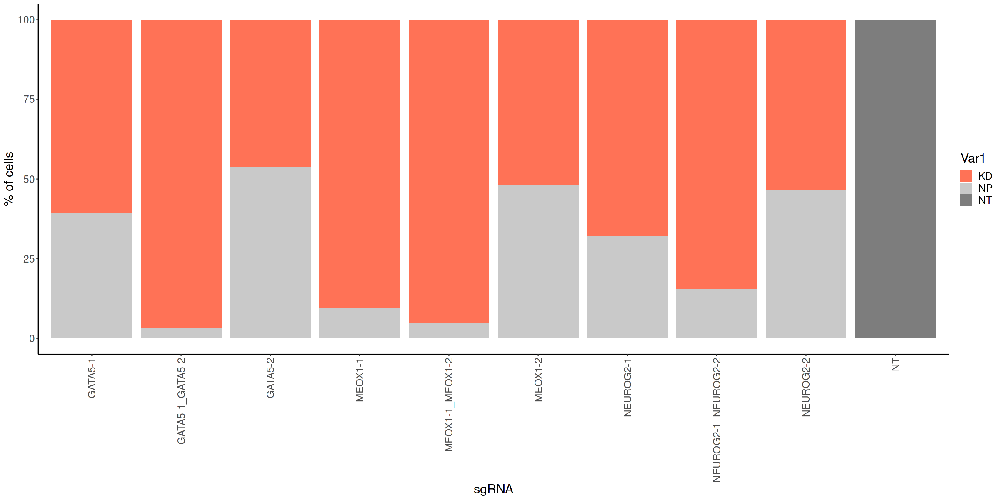

In [70]:
df2 <- reshape2::melt(df1)
df2

options(repr.plot.width = 20, repr.plot.height = 10)
ggplot(df2, aes(x = Var2, y = value*100, fill= Var1)) +
  geom_bar(stat= "identity") +
  theme_classic()+
  scale_fill_manual(values = c("coral1","grey79", "grey49")) + 
  ylab("% of cells") +
  xlab("sgRNA") + theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1), text = element_text(size = 18)) 

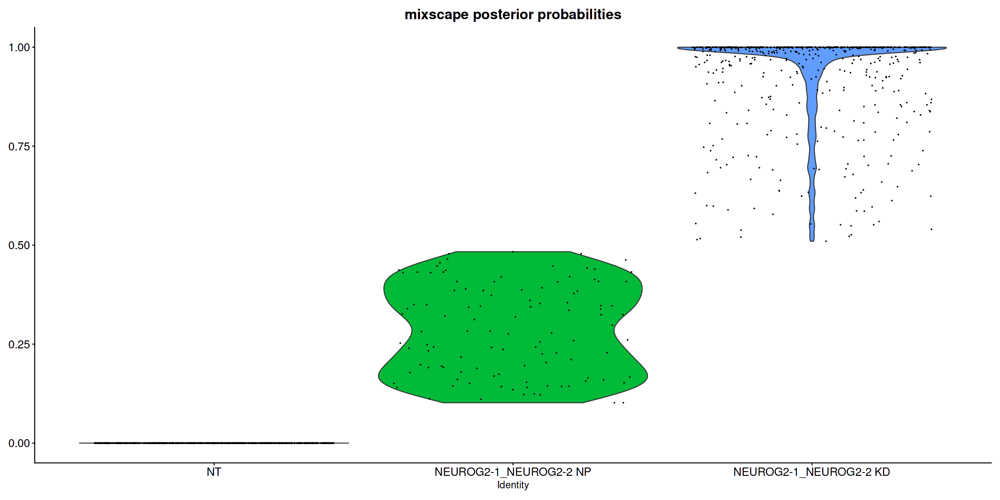

In [71]:
# Inspect the posterior probability values in NP and KO cells.
VlnPlot(seurat.singlet, "mixscape_class_p_kd", idents = c("NT", "NEUROG2-1_NEUROG2-2 KD", "NEUROG2-1_NEUROG2-2 NP")) +
  theme(axis.text.x = element_text(angle = 0, hjust = 0.5),axis.text = element_text(size = 16) ,plot.title = element_text(size = 20)) + 
  NoLegend() +
  ggtitle("mixscape posterior probabilities")

The group.by parameter is being deprecated. Please use mixscape.class instead. Setting mixscape.class = mixscape_class and continuing.

Centering and scaling data matrix



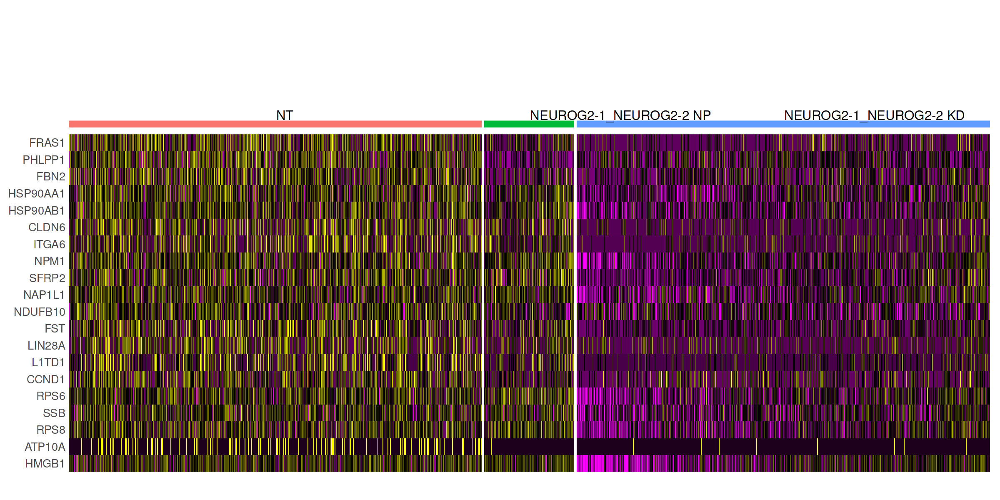

In [72]:
# Run DE analysis and visualize results on a heatmap ordering cells by their posterior 
# probability values.
Idents(object = seurat.singlet) <- "guidecapture_classification"
MixscapeHeatmap(object = seurat.singlet, 
                logfc.threshold = 0.2,
                ident.1 = "NT", 
                ident.2 = "NEUROG2-1_NEUROG2-2",
                balanced = F, 
                assay = "SCT", 
                max.genes = 20, angle = 0, 
                group.by = "mixscape_class", 
                prtb.type = "KD",
                max.cells.group = 500, 
                size=6.5) + NoLegend() +theme(axis.text.y = element_text(size = 16))

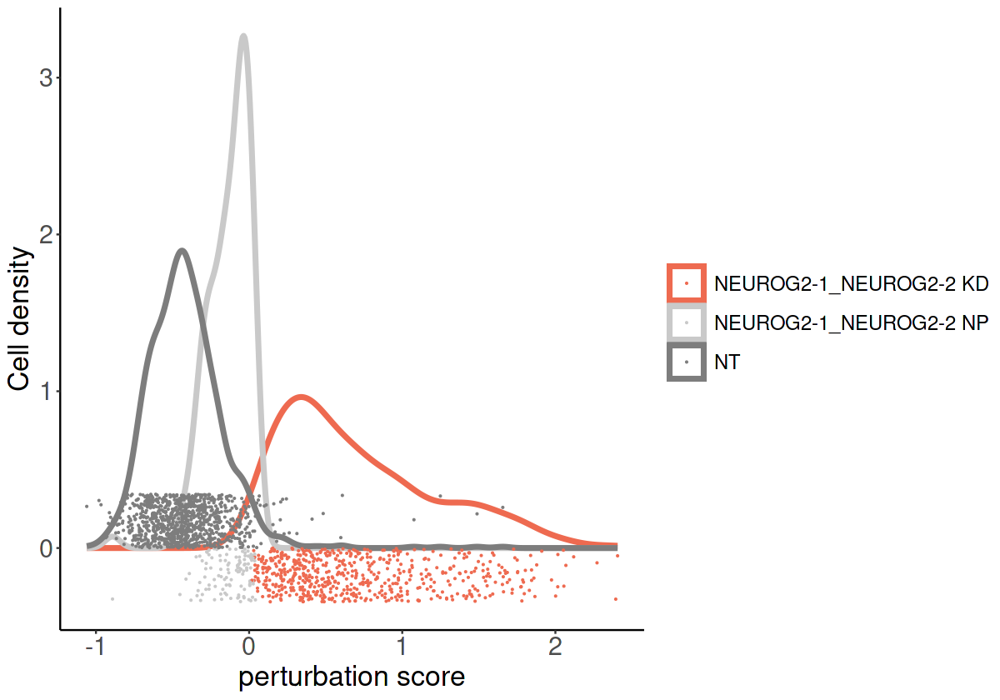

In [73]:
options(repr.plot.width = 10, repr.plot.height = 7)
# Explore the perturbation scores of cells.
PlotPerturbScore(object = seurat.singlet, 
                 target.gene.class = "guidecapture_classification",
                 target.gene.ident = "NEUROG2-1_NEUROG2-2", 
                 mixscape.class = "mixscape_class", 
                 prtb.type = "KD",
                 col = "coral2") +labs(fill = "mixscape class")

The default behaviour of split.by has changed.
Separate violin plots are now plotted side-by-side.
To restore the old behaviour of a single split violin,
set split.plot = TRUE.
      
This message will be shown once per session.



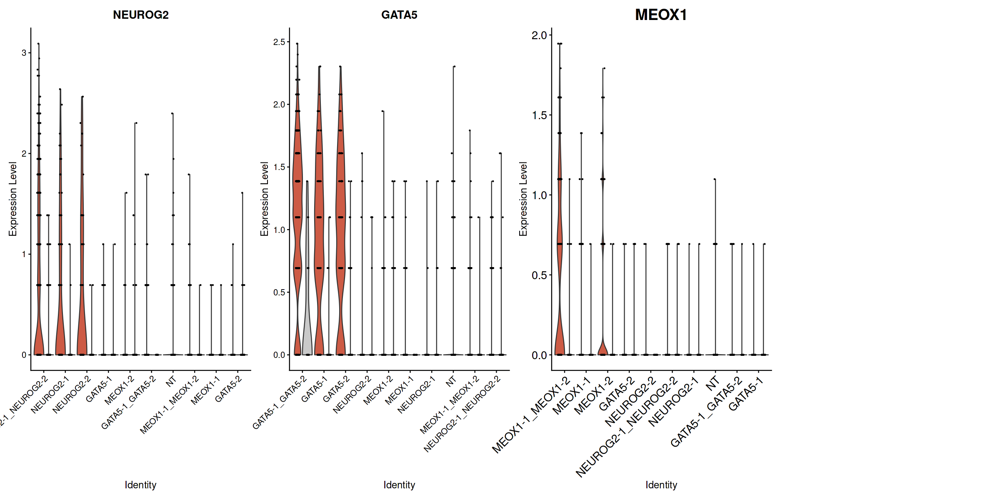

In [74]:
options(repr.plot.width = 20, repr.plot.height = 10)
VlnPlot(
  object = seurat.singlet, 
  features = c("NEUROG2", "GATA5", "MEOX1"),  
  group.by = "guidecapture_classification", 
  pt.size = 0.2, 
  sort = T, 
  ncol = 4,
  split.by = "mixscape_class.global", 
  cols = c("coral3","grey79","grey39")) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1), plot.title = element_text(size = 22), axis.text = element_text(size = 16))


# Visualizing perturbation responses with Linear Discriminant Analysis (LDA)

In [75]:
# Remove non-perturbed cells and run LDA to reduce the dimensionality of the data.
Idents(seurat.singlet) <- "mixscape_class.global"
sub <- subset(seurat.singlet, idents = c("KD", "NT"))


In [76]:
sub <- MixscapeLDA(
  object = sub, 
  assay = "SCT", 
  pc.assay = "PRTB", 
  labels = "guidecapture_classification", 
  nt.label = "NT", 
  npcs = 10, 
  logfc.threshold = 0.2, 
  verbose = F)

Warning message:
"The following arguments are not used: norm.method"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"The following arguments are not used: norm.method"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occu

In [77]:
# Use LDA results to run UMAP and visualize cells on 2-D. 
# Here, we note that the number of the dimensions to be used is equal to the number of 
# labels minus one (to account for NT cells).

sub <- RunUMAP(
  object = sub,
  dims = 1:4,
  reduction = 'lda',
  reduction.key = 'ldaumap',
  reduction.name = 'ldaumap')

11:41:57 UMAP embedding parameters a = 0.9922 b = 1.112

11:41:57 Read 3553 rows and found 4 numeric columns

11:41:57 Using Annoy for neighbor search, n_neighbors = 30

11:41:57 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

11:41:58 Writing NN index file to temp file /tmp/RtmpSiTNo7/file3c9d2c1a13c80d

11:41:58 Searching Annoy index using 10 threads, search_k = 3000

11:41:58 Annoy recall = 100%

11:41:59 Commencing smooth kNN distance calibration using 10 threads
 with target n_neighbors = 30

11:42:01 Initializing from normalized Laplacian + noise (using irlba)

11:42:01 Commencing optimization for 500 epochs, with 130650 positive edges

11:42:05 Optimization finished

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, 

In [78]:
sub

An object of class Seurat 
341848 features across 3553 samples within 5 assays 
Active assay: SCT (25373 features, 3000 variable features)
 4 other assays present: ATAC, RNA, guidecapture, PRTB
 11 dimensional reductions calculated: lsi, umap.atac, wnn.umap, pca, umap.rna, tsne, umap.guide, prtbpca, prtbumap, lda, ldaumap

In [79]:
# Visualize UMAP clustering results.
Idents(sub) <- "mixscape_class"
sub$mixscape_class <- as.factor(sub$mixscape_class)


In [80]:
# Set colors for each perturbation.
col = setNames(object = hue_pal()(12),nm = levels(sub$mixscape_class))
names(col) <- c(names(col)[1:9], "NT")
col[10] <- "grey60"

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


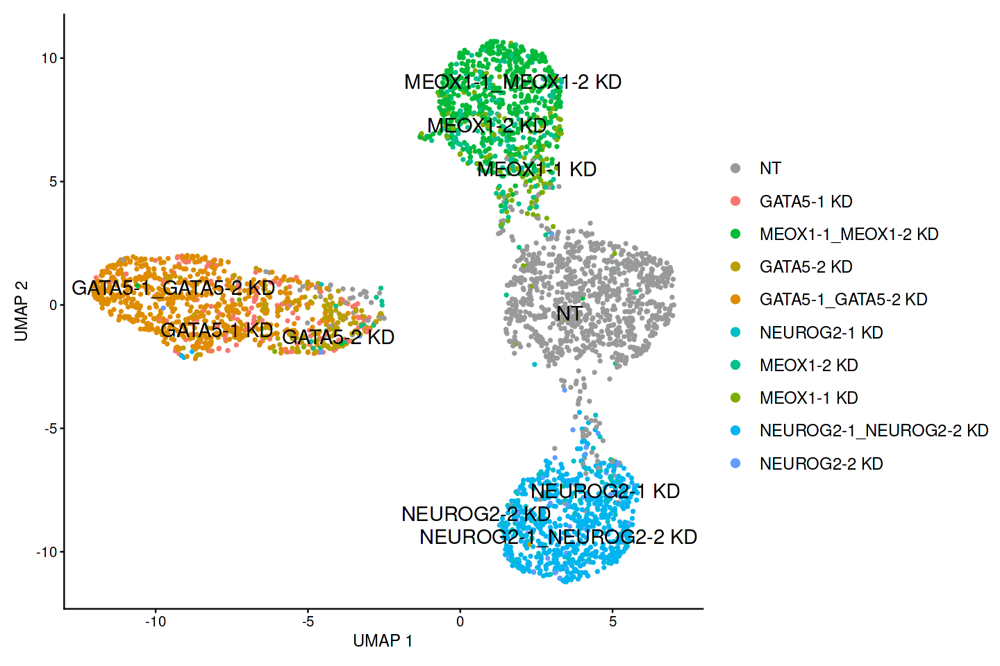

In [81]:
p18 <- DimPlot(object = sub, 
             reduction = "ldaumap", 
             repel = T, 
             pt.size = 1.0, 
             label.size = 6, 
             label = T, 
             cols = col) 

p19 <- p18+ 
  scale_color_manual(values=col, drop=FALSE) + 
  ylab("UMAP 2") +
  xlab("UMAP 1") +
  custom_theme
options(repr.plot.width = 12, repr.plot.height = 8)
p19


In [82]:
cluster_counts <- table(Idents(sub))
as.data.frame(cluster_counts)

Var1,Freq
<fct>,<int>
NT,1006
GATA5-1 KD,129
MEOX1-1_MEOX1-2 KD,523
GATA5-2 KD,167
GATA5-1_GATA5-2 KD,655
NEUROG2-1 KD,89
MEOX1-2 KD,196
MEOX1-1 KD,131
NEUROG2-1_NEUROG2-2 KD,603


In [83]:
# Save the Seurat object using saveRDS()saveRDS(sub, file = '{PATH_TO_CATATAC_COND9_ONLY_SINGLETS_MIXCAPE_SUB_RDS}')